<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 16242874 \
Student1 Name: R.R.Madavan

Student2 ID: 13865196\
Student2 Name: Kim Verkuijl

Student3 ID: Mattia Sferrazza\
Student3 Name: 14226936 

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (2 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (2 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

>*Red, green and blue (intensities) are primary colors, combining them can provide a wide range of colors. Digital images can be represented as a function f: X $\mapsto$ Y, where X is the set of pixel coordinates, and Y represents the set of possible values for each pixel (source: Seminar 1 solutions). Each pixel is represented by 3 colors in RGB.<br><br>
A standard digital camera uses an image sensor, such as Charge-Coupled Device (CCD), which converts photons to electric charges accumulated in each sensor unit (lecture 1b, slide 80). To capture RGB, a color filter can be used. A RGB color filter array (CFA) enables the sensor to measure the intensity of specific colored light at a pixel. <br><br>
The Bayer filter arranges red, green, and blue filters, where green fills in half of checkerboard and red and blue fill the rest (Lecture 1b, slide 111). Each pixel only measures one color component. Therefore, to obtain a full-color image, various demosaicing algorithms can be used to interpolate a set of complete red, green, and blue values for each pixel [(Wikipedia)](https://en.wikipedia.org/wiki/Bayer_filter).*

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [4]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''
    # convert input image to array format if not already
    input_image = np.array(input_image)

    # lightness method
    lightness = (np.max(input_image, axis=2) + np.min(input_image, axis=2)) / 2

    # average method
    average = np.sum(input_image, axis=2) / 3 

    # luminosity method (uses: 0.21*R + 0.72*G + 0.07*B)
    luminosity = 0.21 * input_image[:, :, 0] + 0.72 * input_image[:, :, 1] + 0.07 * input_image[:, :, 2]

    # built-in OpenCV function (uses: 0.299*R + 0.587*G + 0.114*B)
    opencv = cv2.cvtColor(input_image.astype(np.uint8), cv2.COLOR_RGB2GRAY)

    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([lightness, average, luminosity, opencv], axis=-1)

    return new_image


In [5]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''
    input_image = np.array(input_image)
    new_image = input_image
    new_image[:, :, 0] = (input_image[:, :, 0] - input_image[:, :, 1]) / np.sqrt(2)
    new_image[:, :, 1] = (input_image[:, :, 0] + input_image[:, :, 1] - 2 * input_image[:, :, 2]) / np.sqrt(6)
    new_image[:, :, 2] = (input_image[:, :, 0] + input_image[:, :, 1] + input_image[:, :, 2]) / np.sqrt(3)
    
    return new_image

In [6]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''
    input_image = np.array(input_image)
    new_image = input_image
    new_image[:, :, 0] = input_image[:, :, 0] / (input_image[:, :, 0] + input_image[:, :, 1] + input_image[:, :, 2])
    new_image[:, :, 1] = input_image[:, :, 1] / (input_image[:, :, 0] + input_image[:, :, 1] + input_image[:, :, 2])
    new_image[:, :, 2] = input_image[:, :, 2] / (input_image[:, :, 0] + input_image[:, :, 1] + input_image[:, :, 2])
    
    return new_image

In [7]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''
    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function
        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        # fill in the rgb2normedrgb function
        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        ycrcb = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        # Swap to (Y, Cb, Cr) (due to OpenCV convention)
        new_image = ycrcb[:, :, [0, 2, 1]]

    elif colourspace.lower() == 'grays':
        # fill in the rgb2grays function
        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [8]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """
    # Assuming the input image is in RGB
    if colourspace != 'rgb':
        new_image = convert_colour_space(image, colourspace) 
    elif colourspace == 'rgb':
        new_image = image

    fig, axes = plt.subplots(1, 4, figsize=(18, 6))

    if colourspace == 'opponent':
        # Normalized (X - Xmin / Xmax - Xmin)
        O1 = (new_image[:, :, 0] - np.min(new_image[:, :, 0])) / (np.max(new_image[:, :, 0]) - np.min(new_image[:, :, 0]))
        O2 = (new_image[:, :, 1] - np.min(new_image[:, :, 1])) / (np.max(new_image[:, :, 1]) - np.min(new_image[:, :, 1]))
        O3 = (new_image[:, :, 2] - np.min(new_image[:, :, 2])) / (np.max(new_image[:, :, 2]) - np.min(new_image[:, :, 2]))

        opponent_image = np.dstack((O1, O2, O3))

        axes[0].imshow(O1, cmap='RdYlGn_r')
        axes[0].set_title('O1 (red-green) channel')
        axes[0].axis('off')

        axes[1].imshow(O2, cmap='PuOr_r')
        axes[1].set_title('O2 (blue-yellow) channel')
        axes[1].axis('off')

        axes[2].imshow(O3, cmap='gray')
        axes[2].set_title('O3 (brightness) channel')
        axes[2].axis('off')

        axes[3].imshow(opponent_image)
        axes[3].set_title('Opponent (O1, O2, O3)')
        axes[3].axis('off')

        plt.tight_layout()

    elif colourspace in ['rgb', 'nrgb']:
        r = new_image[:, :, 0]
        g = new_image[:, :, 1]
        b = new_image[:, :, 2]

        axes[0].imshow(r, cmap='Reds')
        if colourspace == 'rgb':
            axes[0].set_title('Red channel')
        elif colourspace == 'nrgb':
            axes[0].set_title('Normalized red channel')
        axes[0].axis('off')

        axes[1].imshow(g, 'Greens')
        if colourspace == 'rgb':
            axes[1].set_title('Green channel')
        elif colourspace == 'nrgb':
            axes[1].set_title('Normalized green channel')
        axes[1].axis('off')

        axes[2].imshow(b, 'Blues')
        if colourspace == 'rgb':
            axes[2].set_title('Blue channel')
        elif colourspace == 'nrgb':
            axes[2].set_title('Normalized blue channel')
        axes[2].axis('off')

        axes[3].imshow(new_image)
        if colourspace == 'rgb':
            axes[3].set_title('RGB')
        elif colourspace == 'nrgb':
            axes[3].set_title('Normalized RGB')
        axes[3].axis('off')

        plt.tight_layout()

    elif colourspace == 'hsv':
        # Normalized values 
        h = new_image[:, :, 0] / 360.0
        s = new_image[:, :, 1] / 255.0
        v = new_image[:, :, 2] / 255.0

        axes[0].imshow(h, cmap='hsv')
        axes[0].set_title('Hue')
        axes[0].axis('off')

        axes[1].imshow(s, cmap='gray')
        axes[1].set_title('Saturation')
        axes[1].axis('off')

        axes[2].imshow(v, cmap='gray')
        axes[2].set_title('Value')
        axes[2].axis('off')

        axes[3].imshow(image)
        axes[3].set_title('HSV (RGB plot)')
        axes[3].axis('off')

        plt.tight_layout()

    elif colourspace == 'ycbcr':
        # The Y value can range from 16 to 235 (220 levels), with 16 being black.
        # Y = image[:, :, 0]
        Y = (new_image[:, :, 0] - np.min(new_image[:, :, 0])) / (np.max(new_image[:, :, 0]) - np.min(new_image[:, :, 0]))
        # The Cr and Cb values can range from 16 to 240, with 128 as the mid-point.
        # Cb = image[:, :, 1]
        Cb = (new_image[:, :, 1] - np.min(new_image[:, :, 1])) / (np.max(new_image[:, :, 1]) - np.min(new_image[:, :, 1]))
        # Cr = image[:, :, 2]
        Cr = (new_image[:, :, 2] - np.min(new_image[:, :, 2])) / (np.max(new_image[:, :, 2]) - np.min(new_image[:, :, 2]))


        axes[0].imshow(Y, cmap='gray')
        axes[0].set_title('Y (luminance)')
        axes[0].axis('off')

        axes[1].imshow(Cb, cmap='Blues')
        axes[1].set_title('Cb (blue chrominance)')
        axes[1].axis('off')

        axes[2].imshow(Cr, cmap='Reds')
        axes[2].set_title('Cr (red chrominance)')
        axes[2].axis('off')

        axes[3].imshow(image)
        axes[3].set_title('YCbCr')
        axes[3].axis('off')

        plt.tight_layout()

    elif colourspace == 'grays':
        lightness_img = new_image[:, :, 0]
        average_img = new_image[:, :, 1]
        luminosity_img = new_image[:, :, 2]
        opencv_img = new_image[:, :, 3]

        axes[0].imshow(lightness_img, cmap='gray')
        axes[0].set_title('Lightness method')
        axes[0].axis('off')

        axes[1].imshow(average_img, cmap='gray')
        axes[1].set_title('Average method')
        axes[1].axis('off')

        axes[2].imshow(luminosity_img, cmap='gray')
        axes[2].set_title('Luminosity method')
        axes[2].axis('off')

        axes[3].imshow(opencv_img, cmap='gray')
        axes[3].set_title('OpenCV method')
        axes[3].axis('off')

        plt.tight_layout()

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)
    
    plt.show()

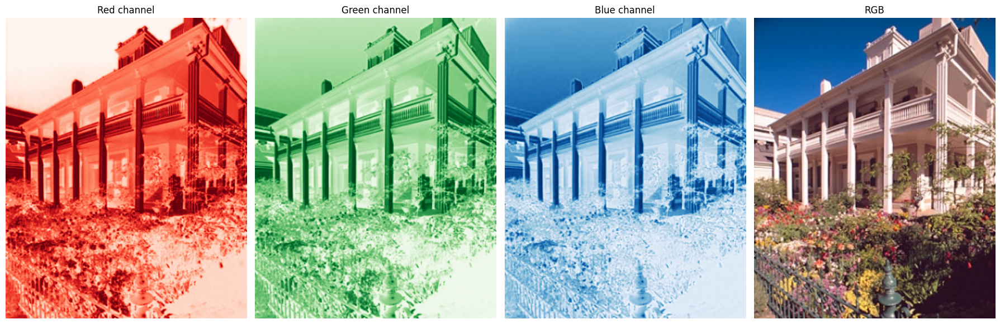

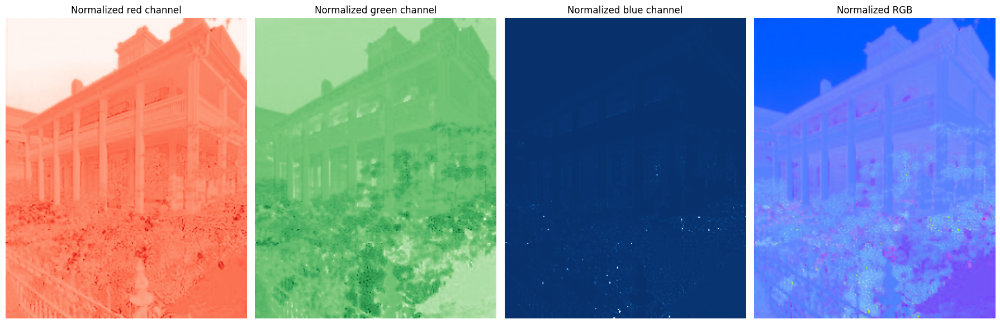

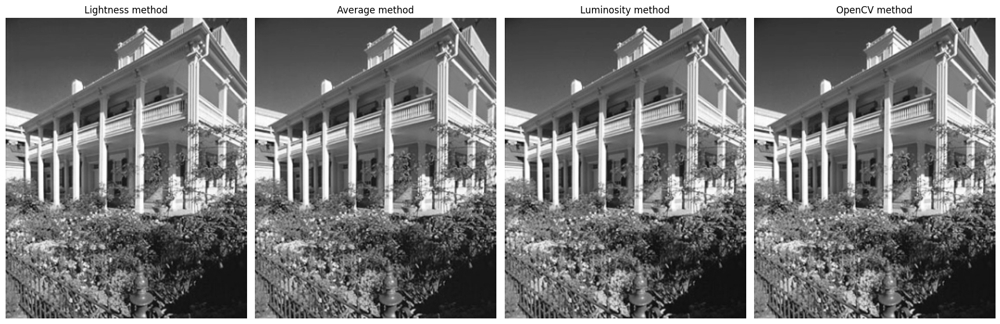

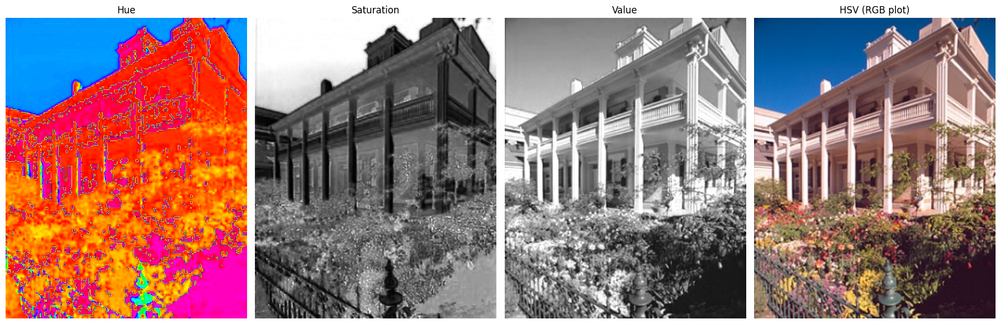

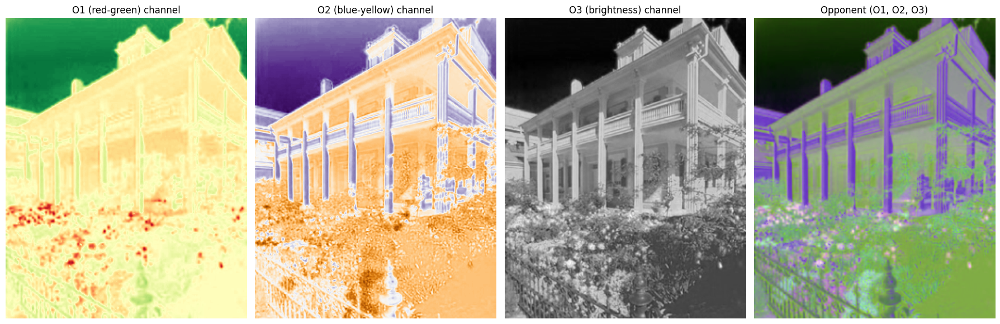

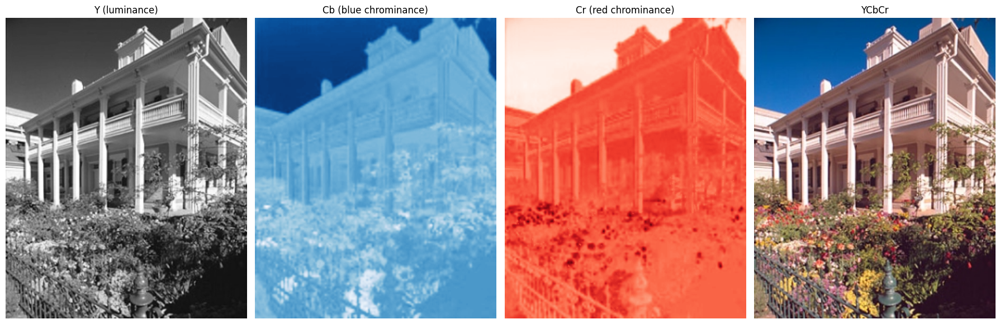

In [9]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# YOUR CODE HERE
visualize_colourspace(image)

for space in [ 'nrgb', 'grays', 'hsv', 'opponent', 'ycbcr']:
    visualize_colourspace(image, space)

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>


>**0. RGB**<br>
>*Represents pixels as a combination of three color channels (red, green and blue). However, brightness and color information are mixed.<br>*
>**1. NRGB**<br>
>*Same as RGB, but each channel is normalized by the sum of red, green and blue. Now each channel represents the fraction of the total intensity. Because it takes the ratio into account, it removes the impact of illumination. The illumination is (almost) gone in the NRGB plot of each channel, compared to the RGB plot of each channel.<br>*
>**2. Gray**<br>
>*Represents only the brightness/luminance per pixel and no color information. This is 1D, and is therefore easier to compute on (if color or other properties are not necessary for a task).<br>*
>**3. HSV**<br>
>*HSV also encodes an image in a 3D tensor, but encodes different information: Hue, Saturation and Value. The Hue ranges from 0-360 and shows the type of color, the saturation decides how intense the colors are, and the Value the brightness. This makes it easier to adjust the brightness or saturation without affecting the hue.<br>*
>**4. Opponent**<br>
>*Channel O1 and O2 captures the difference between red-green and blue-yellow intensities, respectively. It therefore encodes color contrasts. O3 captures the brightness separately as well.<br>*
>**5. YCbCr**<br>
>*This separates luminance (Y) from chrominance (color-information) (Cb, Cr). Therefore, this also allows for adjusting the color and luminance separately.*



<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

>* **CIE 1931 color space** <br>
*CIE 1931 color space chromaticity diagram has wavelengths in nanometers. The colors depicted depend on the color space
of the device on which the image is viewed (Lecture 1b, slide 150). By using the CIE color space, one can predict how a color mixture will appear to human vision. The image is represented in three tristimulus values: X (red-green), Y (luminance), and Z (blue-yellow). An example of a use case is color calibration, so that colors appear consistently in different devices with different hardware etc. An example from [Medium](https://medium.com/hipster-color-science/a-beginners-guide-to-colorimetry-401f1830b65a) on the CIE 1931 Color Matching function: "Let’s say you have three lights, a red and green and a blue with precisely known single wavelengths. If you point these lights at the same spot on the wall is it possible to adjust the power of each light until the spot had the exactly same color as 540nm light?"*

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [ ]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """
    
    r_avg = awb_img[:, :, 0].mean()
    g_avg = awb_img[:, :, 1].mean()
    b_avg = awb_img[:, :, 2].mean()
    gray_world = 128
    
    target_gray_value = (r_avg + g_avg + b_avg) / 3
    
    if target_gray_value == 128 or target_gray_value == 127:
        gw_img = awb_img
        pass
    else:
        r_scale = gray_world - r_avg
        g_scale = gray_world - g_avg
        b_scale = gray_world - b_avg
        
        r_new = np.clip(r_scale + awb_img[:, :, 0], 0, 255)/255
        g_new = np.clip(g_scale + awb_img[:, :, 1], 0, 255)/255
        b_new = np.clip(b_scale + awb_img[:, :, 2], 0, 255)/255
        gw_img = np.array([r_new, g_new, b_new]).transpose(1, 2, 0)

    return gw_img, r_scale, g_scale, b_scale

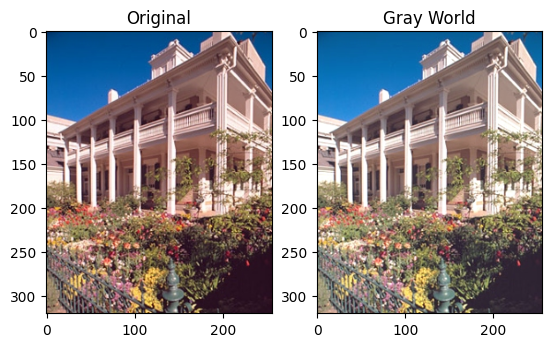

In [11]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gw_img,_,_,_ = apply_grey_world_algorithm(image)
# plt.imshow('Original', image)
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.subplot(1, 2, 2)
plt.title("Gray World")
plt.imshow(gw_img)

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

>*The Gray-World Algorithm works well only when there is a variety of colours in the image. If the image has any dominant colours, the algorithm will fail as it assumes a mean gray world, with the averages of all channels resulting in the gray colour. A high value on a specific channel can produce images with completely different colours rather than equalised colours.*

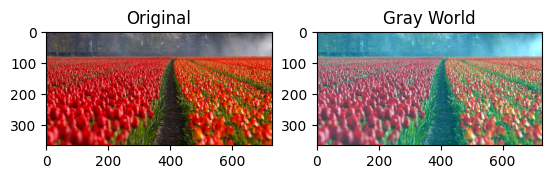

In [12]:
image = cv2.imread('images/gray-world-failure.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gw_img,_,_,_ = apply_grey_world_algorithm(image)

plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.subplot(1, 2, 2)
plt.title("Gray World")
plt.imshow(gw_img)

>*As we can see the image with Red Dominance causes the flowers on the right side to take a more yellowish colour which is unnatural.*

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

> ### Histogram Equalisation
>*The intuition of Histogram equalisation is to have an almost uniform distribution of pixel values. For a grayscale image, each gray value is assiciated with a probability $p_i = \frac{n_i}{N}$ which is the number of pixels with the gray value $i$ and $N$ is the toal number of pixels in the image. In this case value $i \in [0,255]$. Using the $n_i$ values for each gray value we can get the cumulative distribution of the values. For the original image this distribution would be non-linear, the purpose of this algorithm is to make this CDF linear. From the probablity values we <br>
We then normalise the CDF values (using min-max normalisation) to strecth them along the value $[0,1]$. Then we multiply the normalised values by 255 to take them to the original pixel value range.*

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

>*Besides albedo and shading, an image can also be decomposed into specular reflection (shiny/glossy highlights caused by the reflection of light) and ambient illumination (light indirectly scattered from the surrounding). For example, in a photo of a glossy mug, the albedo is the mug’s true base color, shading is the shadows (how the light falls on its surface), the specular component is the bright white highlight and ambient light could account for the soft glow in the scene, possibly adding a soft overall brightness.*>*Write your answer here.*>*Write your answer here.*

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

>*Intrinsic decomposition datasets are usually synthetic because obtaining true albedo and shading for real images is nearly impossible, due to the real-world setting having many other factors that affect the image. Synthetic data gives full control over lighting and materials (something very diffcult to fully control for in a real-world setting) and thus accurate ground truth labels can be created for training and testing.*>*Write your answer here.*

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [13]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """

    R = albedo_img.astype(np.float32) / 255.0
    S = shading_img.astype(np.float32) / 255.0
    I = np.clip(R * S, 0.0, 1.0)
    iid_img = (I * 255.0 + 0.5).astype(np.uint8)
    
    return iid_img

object shape: (266, 480, 3)
object albedo shape: (266, 480, 3)
object shading shape: (266, 480, 3)


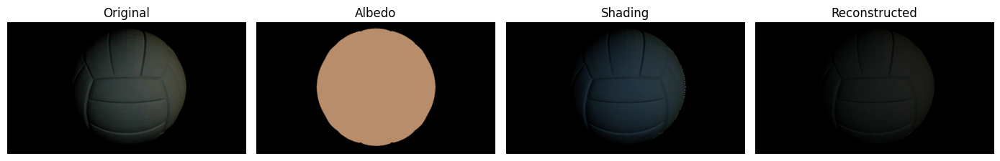

In [14]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'turt_ml1'
object_name = 'ball_ml1'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

# YOUR CODE HERE
iid = reconstruct_image_from_intrinsics(obj_alb, obj_sha)

fig, axs = plt.subplots(1, 4, figsize=(14,4))
axs[0].imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original"); axs[0].axis("off")

axs[1].imshow(cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB))
axs[1].set_title("Albedo"); axs[1].axis("off")

axs[2].imshow(cv2.cvtColor(obj_sha, cv2.COLOR_BGR2RGB))
axs[2].set_title("Shading"); axs[2].axis("off")

axs[3].imshow(cv2.cvtColor(iid, cv2.COLOR_BGR2RGB))
axs[3].set_title("Reconstructed"); axs[3].axis("off")

plt.tight_layout()
plt.show()

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [15]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    mean_rgb = albedo_img.mean(axis=(0,1))
    #Here since we average all pixels, it also includes the black background
    true_colour = mean_rgb.astype(np.uint8)
    return true_colour

True color (R,G,B): [63 48 37]
[63 48 37]


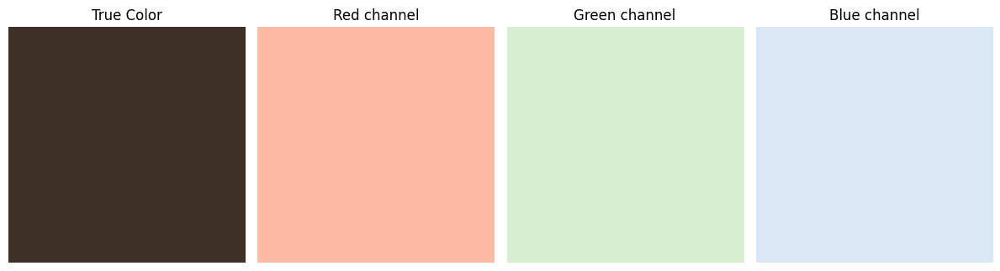

In [16]:
#get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)

#get true material color
true_color = get_true_color(obj_alb_rgb)
print("True color (R,G,B):", true_color)

color_patch = np.tile(true_color, (100,100,1))

fig, axs = plt.subplots(1, 4, figsize=(12,4))

axs[0].imshow(color_patch)
axs[0].set_title("True Color"); axs[0].axis("off")

axs[1].imshow(np.tile(true_color[0], (100,100)), cmap = "Reds", vmin=0, vmax=255)
axs[1].set_title("Red channel"); axs[1].axis("off")
print(true_color)

axs[2].imshow(np.tile(true_color[1], (100,100)), cmap = "Greens", vmin=0, vmax=255)
axs[2].set_title("Green channel"); axs[2].axis("off")

axs[3].imshow(np.tile(true_color[2], (100,100)), cmap = "Blues", vmin=0, vmax=255)
axs[3].set_title("Blue channel"); axs[3].axis("off")

plt.tight_layout()
plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [17]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """
    alb_rgb = cv2.cvtColor(albedo_img, cv2.COLOR_BGR2RGB)
    mask = (np.linalg.norm(alb_rgb.astype(np.float32), axis=2) > 5)

    recolored_alb_rgb = np.zeros_like(alb_rgb)            #start black
    recolored_alb_rgb[mask] = (255, 0, 0)                 #pure red where object is

    recolored_alb_bgr = cv2.cvtColor(recolored_alb_rgb, cv2.COLOR_RGB2BGR)

    recolored_img = reconstruct_image_from_intrinsics(recolored_alb_bgr, shading_img)

    return recolored_img

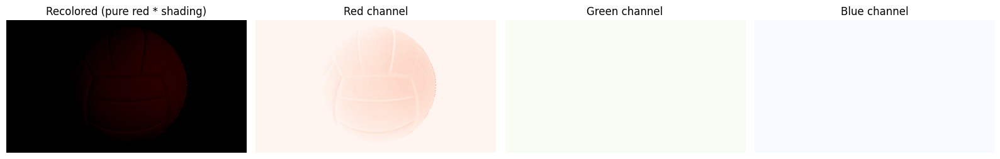

In [18]:
recolored_image = recolor_image(obj_alb, obj_sha)

recolored_image = recolor_image(obj_alb, obj_sha)

recolored_rgb = cv2.cvtColor(recolored_image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 4, figsize=(16,4))
axs[0].imshow(recolored_rgb)
axs[0].set_title("Recolored (pure red * shading)")
axs[0].axis("off")

axs[1].imshow(recolored_rgb[...,0], cmap='Reds', vmin=0, vmax=255)
axs[1].set_title("Red channel");  axs[1].axis("off")

axs[2].imshow(recolored_rgb[...,1], cmap='Greens', vmin=0, vmax=255)
axs[2].set_title("Green channel"); axs[2].axis("off")

axs[3].imshow(recolored_rgb[...,2], cmap='Blues', vmin=0, vmax=255)
axs[3].set_title("Blue channel");  axs[3].axis("off")

plt.tight_layout()
plt.show()

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

>*Because the reconstruction is albedo × shading, your pure-red albedo is multiplied by a non-uniform shading map. Brightly lit pixels stay bright red, shadowed pixels become dark red, so the color over the object isn’t uniform or “pure” everywhere*>*Write your answer here.*

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [19]:
def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            # print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [20]:
def show_results(albedo, normals, height_map=None, SE=None, normal_plot=True, height_label="Height Map", SE_label="SE"):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    # stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        # print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    if normal_plot and normals is not None:
        # showing normals as three separate channels
        figure = plt.figure(figsize=(10, 10))
        ax1 = figure.add_subplot(221)
        ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
        ax1.set_axis_off()
        ax1.set_title('Normal Channel x', fontsize=16)
        ax2 = figure.add_subplot(222)
        ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
        ax2.set_axis_off()
        ax2.set_title('Normal Channel y', fontsize=16)
        ax3 = figure.add_subplot(223)
        ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
        ax3.set_axis_off()
        ax3.set_title('Normal Channel z', fontsize=16)
        ax4 = figure.add_subplot(224)
        ax4.imshow((normals + 1) * 0.5)
        ax4.set_axis_off()
        ax4.set_title('Combined Normals', fontsize=16)
        plt.show()

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title(height_label)

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title(SE_label)

        plt.tight_layout()
        plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title(height_label)
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title(SE_label)
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [21]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    # YOUR CODE HERE
    nr_images = image_stack.shape[2]

    for row in range(h):
        for col in range(w): 
            i_vec = image_stack[row, col, :]

            # diagonal matrix
            if shadow_trick:
                scriptI = np.diag(i_vec)
            else:
                scriptI = np.eye(nr_images)  

            # solve for g
            A = scriptI @ scriptV  
            b = scriptI @ i_vec 
            g = np.linalg.lstsq(A, b, rcond=None)[0]

            # compute albedo
            albedo[row, col] = np.linalg.norm(g)

            # compute surface albedo
            stabilisation_constant = 0.0001 # avoid division by zero
            normal[row, col, :] = g / (albedo[row, col] + stabilisation_constant)

    return albedo, normal

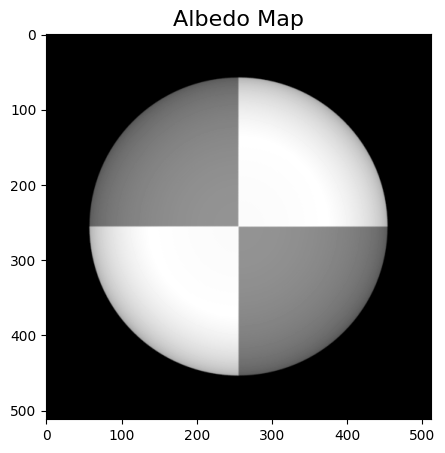

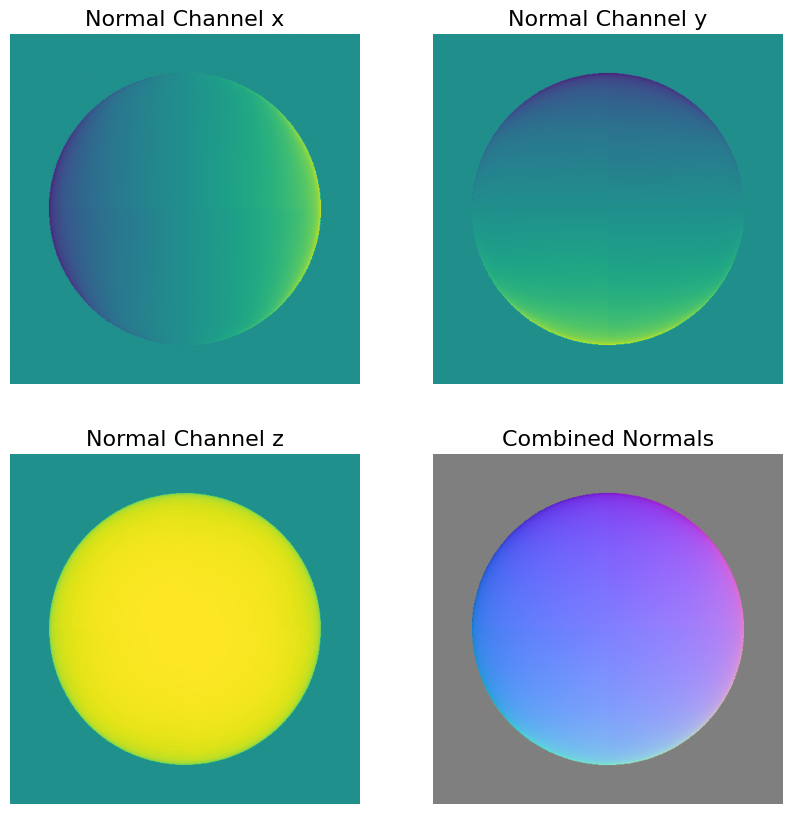

In [22]:
# load synthetic images for SphereGray5
image_stack, normalized_light_dirs = load_synthetic_images()

# estimate albedo and normals
albedo_5, normals_s5 = estimate_albedo_and_normals(image_stack, normalized_light_dirs)

# show results
show_results(albedo_5, normals_s5)

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

>*The Albedo image is expected to show the percentage of reflected light. The observed result is similar to the image when the source of light is at 0,0, with the center of the sphere being illuminated more than the borders.*<br>


<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

>*g that will be calculated has 3 dimensions (x,y,z), where the norm of g is the albedo. Therefore, 3 independent equations are needed to solve for 3 unknowns. Thus, 3 images (that are with independent lighting directions) are the minimum number. <u>(Computer Vision A Modern Approach Chapter 5.4 page 82)*<u>

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

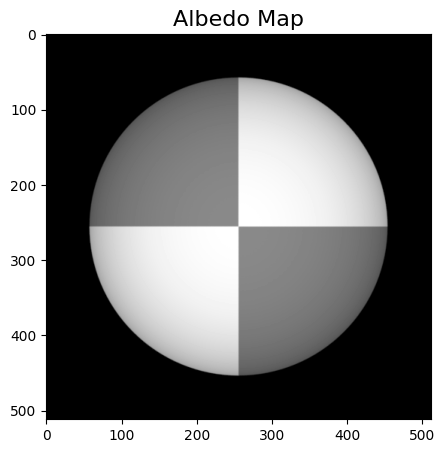

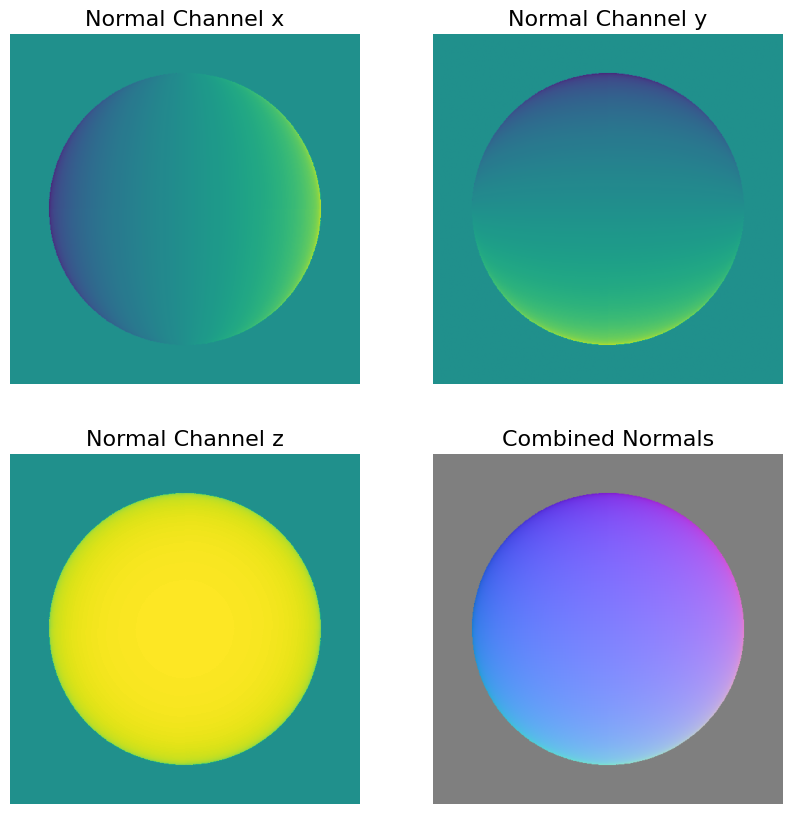

In [23]:
# load synthetic images for SphereGray25
image_stack, normalized_light_dirs = load_synthetic_images(image_dir="./photometrics_images/SphereGray25/")

# estimate albedo and normals
albedo_25, normals_s25 = estimate_albedo_and_normals(image_stack, normalized_light_dirs)

# show results
show_results(albedo_25, normals_s25)

##### <font color='yellow'>Answer:</font>

>*With 5 images of the sphere, the computed normals have a slight discrepancy between the dark and the light regions of the sphere (for normal x and y channel), even though they at the same level and are expected to be uniform. On the other hand, with 25 images of the sphere we can see that there is not a discrepancy, and more smooth.*<br>

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

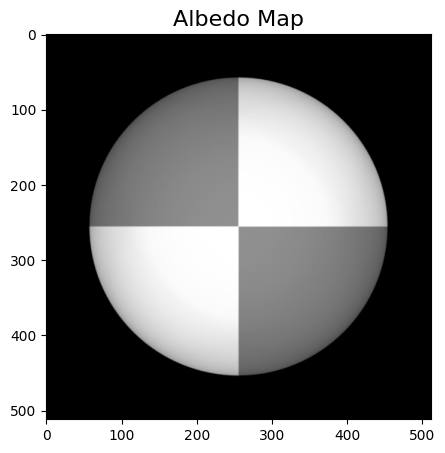

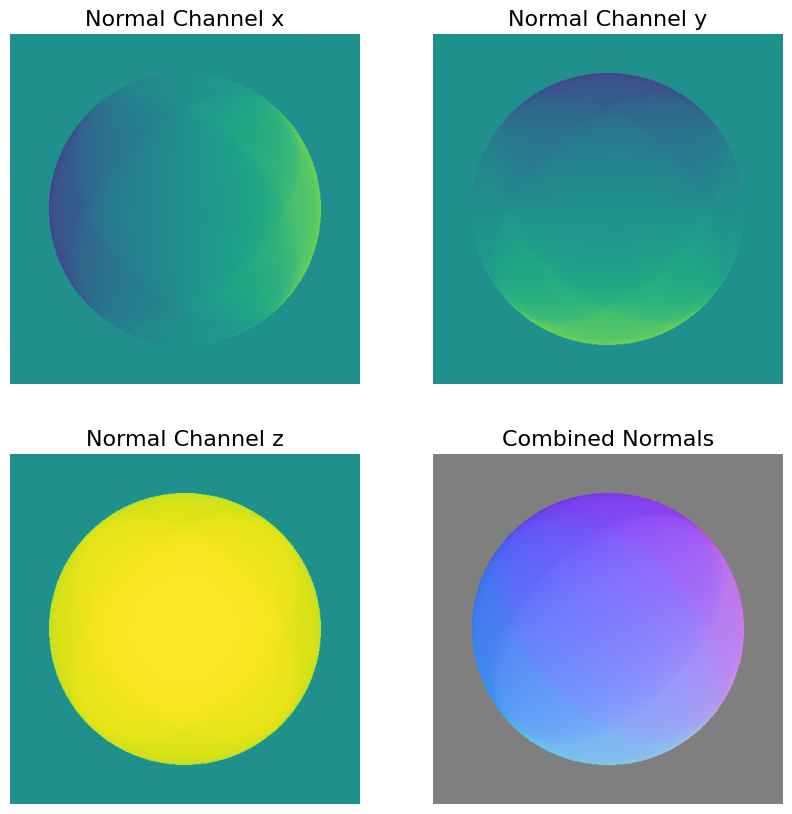

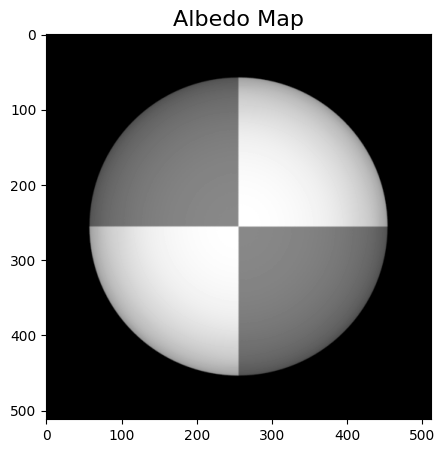

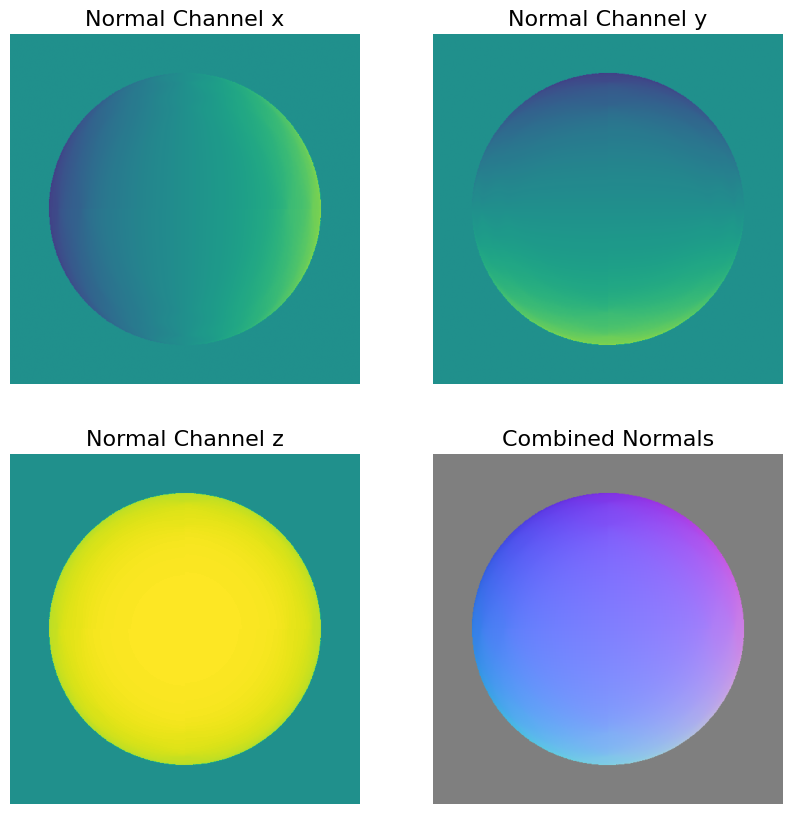

In [24]:
# load synthetic images for SphereGray5 and SphereGray25
image_stack_5, normalized_light_dirs_5 = load_synthetic_images(image_dir="./photometrics_images/SphereGray5/")
image_stack_25, normalized_light_dirs_25 = load_synthetic_images(image_dir="./photometrics_images/SphereGray25/")

# estimate albedo and normals without shadow trick
albedo_5_no_shadow, normals_s5_no_shadow = estimate_albedo_and_normals(image_stack_5, normalized_light_dirs_5, shadow_trick=False)
albedo_25_no_shadow, normals_s25_no_shadow = estimate_albedo_and_normals(image_stack_25, normalized_light_dirs_25, shadow_trick=False)

# show results without shadow trick
show_results(albedo_5_no_shadow, normals_s5_no_shadow)
show_results(albedo_25_no_shadow, normals_s25_no_shadow)

##### <font color='yellow'>Answer:</font>

>*Using the shadow trick: scriptI has the effect of zeroing the contributions from shadowed regions <u>(Computer Vision: A Modern Approach Chapter 5.4, page 83)</u>. In the result of 5 images without shadow-trick (i.e shadowed pixels are used), the shadows (noise) are very visible in the normal channels. In the result of 25 images without shadow-trick, the shadows are much less visible, and smoother. The impact of a shadowed pixel is more weakened when there are more images with more lightning directions.*

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [25]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """
    
    # initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])
    stabilising_constant = 0.0001
    
    # calculate p and q using the normals
    p = normals[:, :, 0] / (normals[:, :, 2] + stabilising_constant)
    q = normals[:, :, 1] / (normals[:, :, 2] + stabilising_constant)
    
    #Getting mixed partial derivatives
    mixed_p = (np.roll(p, -1, axis=0) - np.roll(p, 1, axis=0)) / 2
    mixed_q = (np.roll(q, -1, axis=1) - np.roll(q, 1, axis=1)) / 2

    SE = (mixed_p - mixed_q)**2
    
    return p, q, SE

In [26]:
# Use the normals that you found in the previous question
p, q, SE_5 = check_integrability(normals_s5)

print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {SE_5.max()}\n')

p, q, SE_25 = check_integrability(normals_s25)

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {SE_25.max()}')

Showing the integrability check results for 5 light sources:
SE max: 1.1569610806778305

Showing the integrability check results for 25 light sources:
SE max: 0.8667569948825751


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

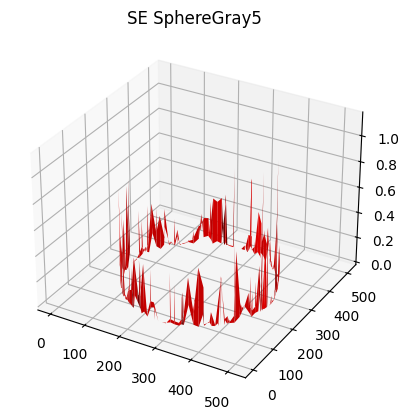

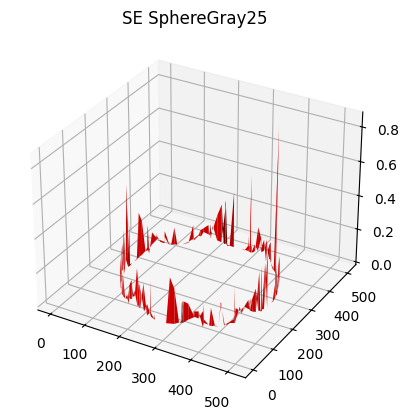

In [27]:
threshold = 0.001

SE_5[SE_5 <= threshold] = float('nan')
show_results(None, normals_s5, height_map=None, SE=SE_5, normal_plot=False, SE_label="SE SphereGray5")
        
SE_25[SE_25 <= threshold] = float('nan')
show_results(None, normals_s5, height_map=None, SE=SE_25, normal_plot=False, SE_label="SE SphereGray25")

##### <font color='yellow'>Answer:</font>

>*All the squared error obtained above the threshold belongs to the extremes/borders of the object. This is because the gradient observed along the borders are high, meaning the immediate change from the object's pixel value to the black background causes the high SE values. <br>
>The amount of Squared error has decreased slightly when using 25 image instead of 5. As the number of images increase the squared error decreases.*

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [28]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        #Integrate q down the first column
        for y in range(1, h):
            height_map[y, 0] = height_map[y - 1, 0] + q[y, 0]
        #Now for each row, integrate p to the right
        for y in range(h):
            for x in range(1, w):
                height_map[y, x] = height_map[y, x - 1] + p[y, x]

    elif path_type == 'row':
        #Integrate p along the first row
        for x in range(1, w):
            height_map[0, x] = height_map[0, x - 1] + p[0, x]
        #for each column, integrate q downward
        for y in range(1, h):
            for x in range(w):
                height_map[y, x] = height_map[y - 1, x] + q[y, x]

    elif path_type == 'average':
        #Average multiple paths to spread derivative noise (recommended in the book)
        height_col = construct_surface(p, q, 'column')
        height_row = construct_surface(p, q, 'row')
        height_map = 0.5 * (height_col + height_row)

    return height_map

Showing the surface reconstruction results for 5 light sources using column-major integration:


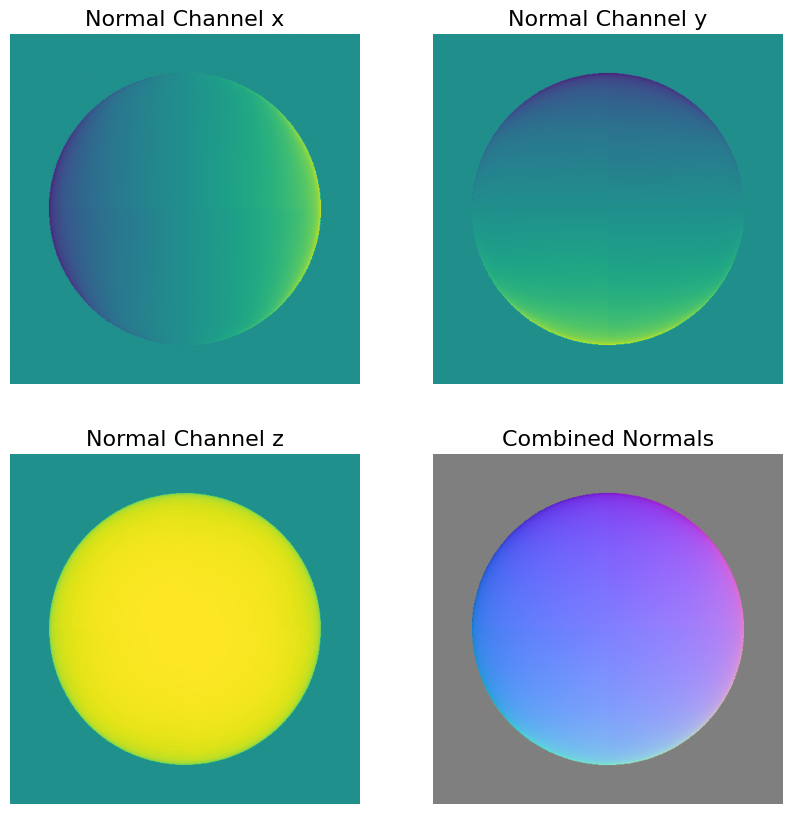

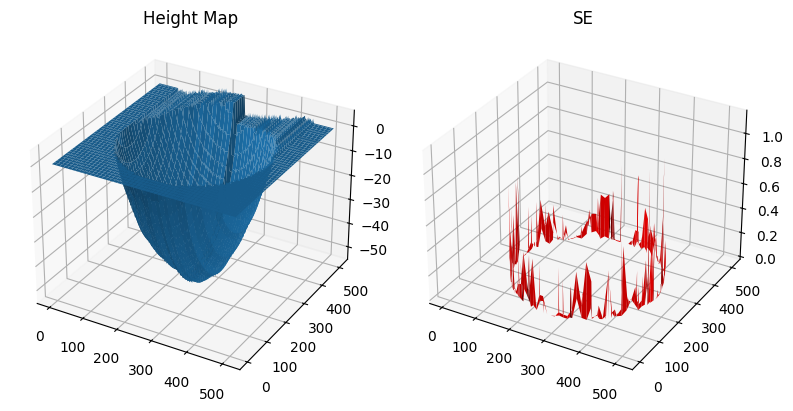

In [29]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "column")

threshold = 0.001
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using column-major integration:')
show_results(None, normals_s5, height_map, SE)

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

Column-major reconstruction:


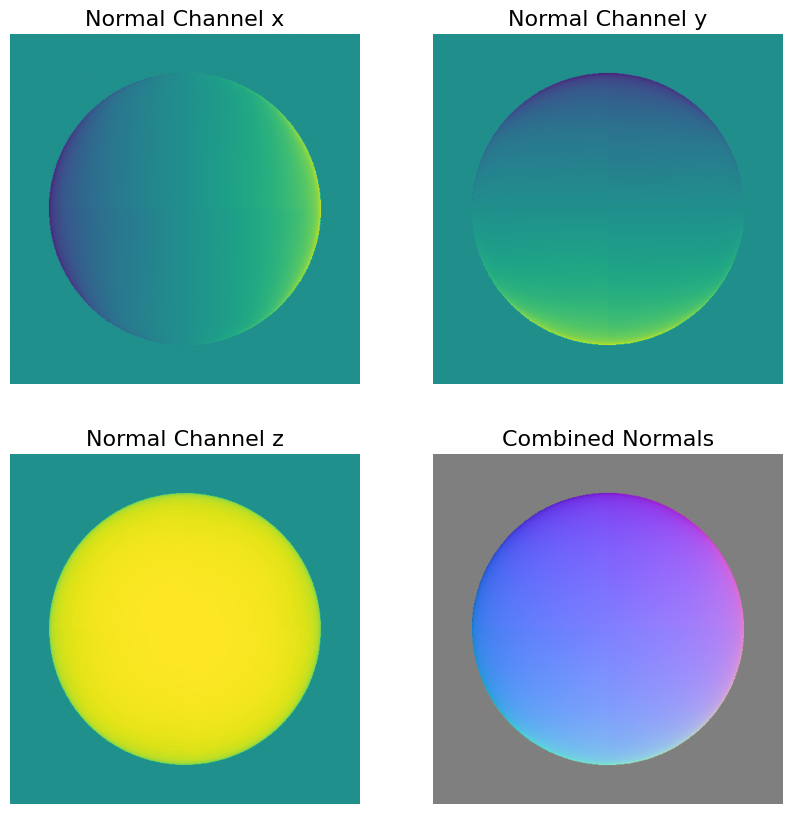

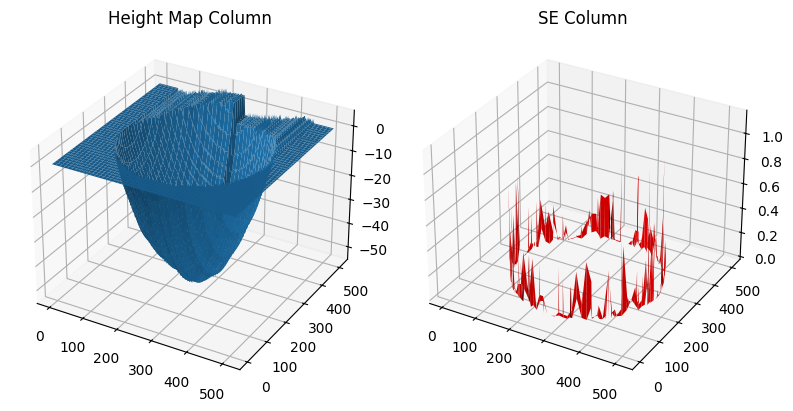

Row-major reconstruction:


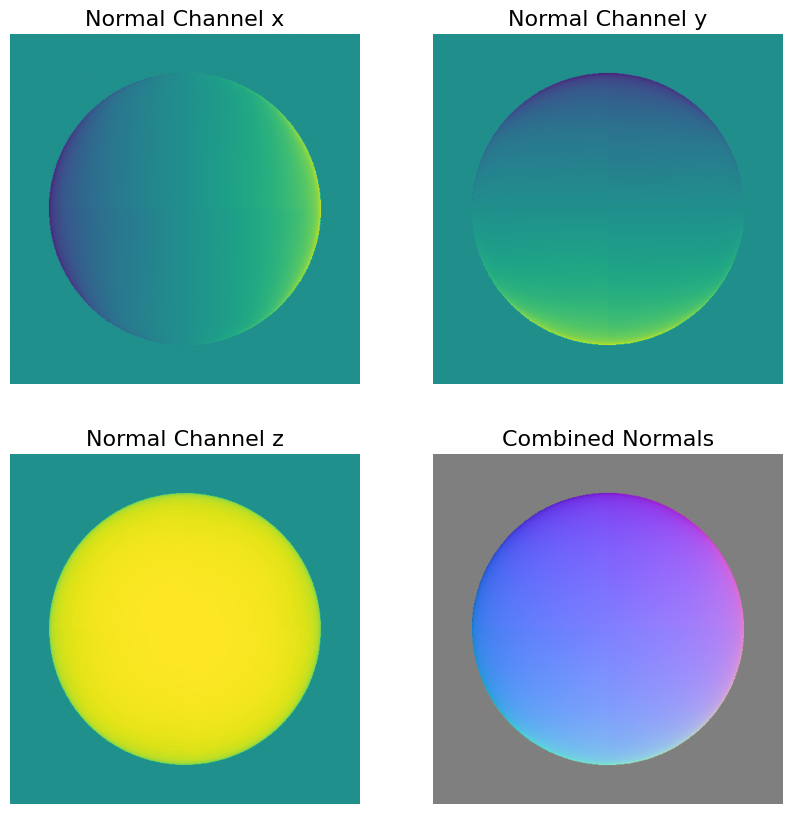

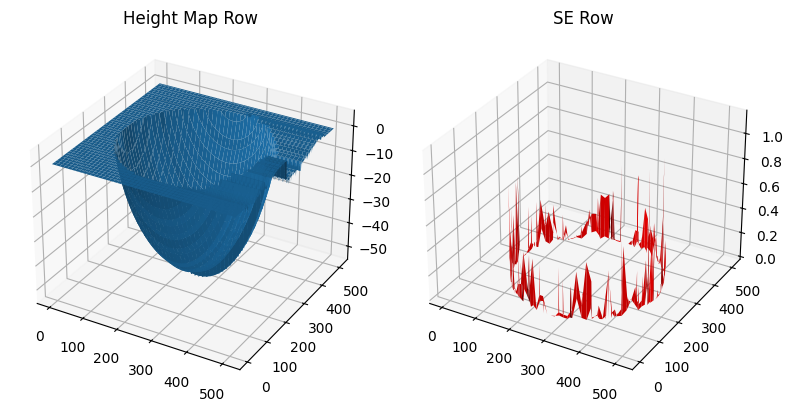

In [30]:
height_col = construct_surface(p, q, "column")
height_row = construct_surface(p, q, "row")

#Column
print("Column-major reconstruction:")
show_results(None, normals_s5, height_col, SE, height_label="Height Map Column", SE_label='SE Column')

#Row
print("Row-major reconstruction:")
show_results(None, normals_s5, height_row, SE, height_label="Height Map Row", SE_label="SE Row")

diff = height_col - height_row


##### <font color='yellow'>Answer:</font>

>*Both the column-major and row-major integrations recover the overall spherical shape, but the resulting height maps are not identical because integration errors build up differently depending on the path. The column-major approach introduces mainly vertical horizontal distortions, while the row-major approach shows horizontal ones. The column-major approach integrates first over the columns and then over the rows. If there is noise after the first integration, that gets spread horizontally by the second integration.*<br>

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (2 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

Average reconstruction (5 lights):


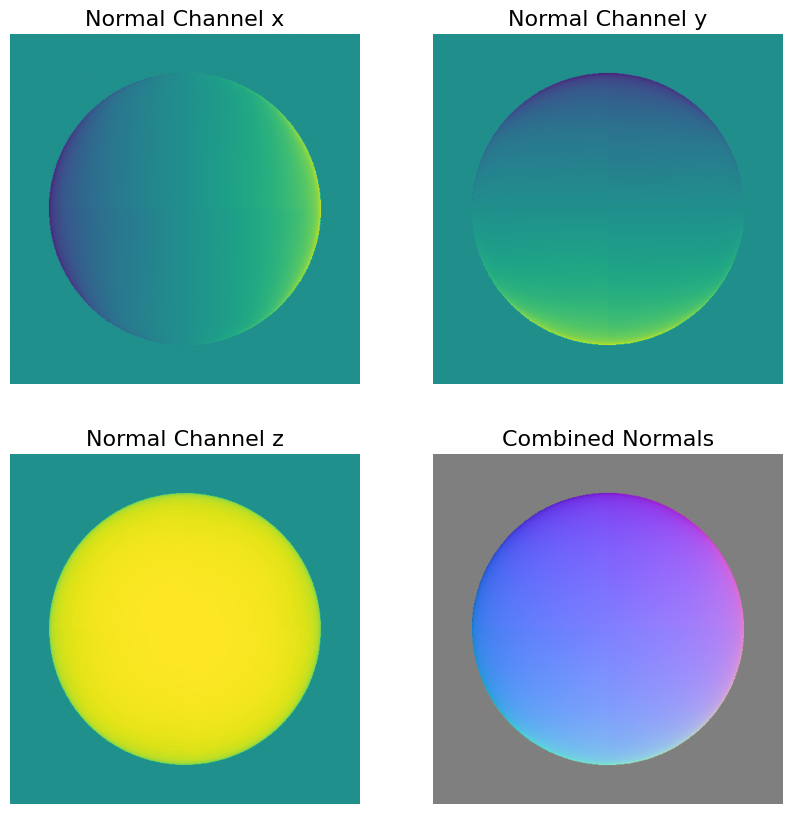

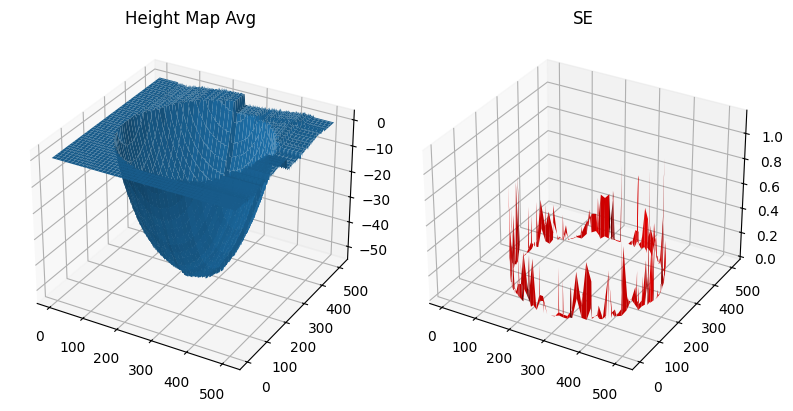

Average reconstruction (25 lights):


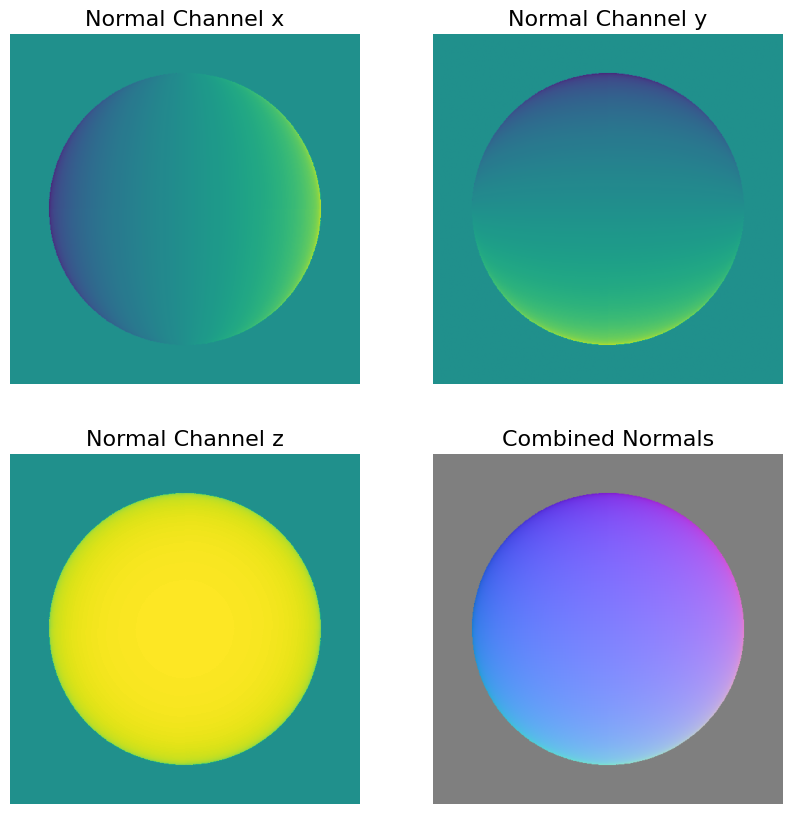

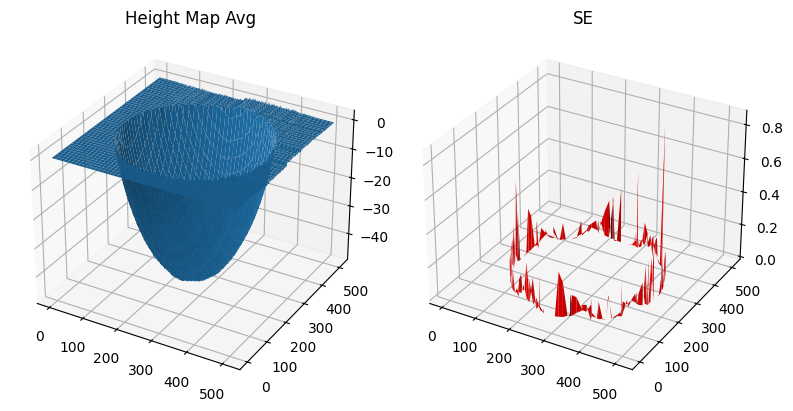

In [31]:
p5, q5, SE5 = check_integrability(normals_s5)
threshold = 0.001
SE5[SE5 <= threshold] = float('nan')
h_avg_5 = construct_surface(p5, q5, path_type="average")
print("Average reconstruction (5 lights):")
show_results(None, normals_s5, h_avg_5, SE5, height_label="Height Map Avg")

p25, q25, SE25 = check_integrability(normals_s25)
SE25[SE25 <= threshold] = float('nan')
h_avg_25 = construct_surface(p25, q25, path_type="average")
print("Average reconstruction (25 lights):")
show_results(None, normals_s25, h_avg_25, SE25, height_label="Height Map Avg")

##### <font color='yellow'>Answer:</font>

>*Combining the two paths generally yields a better reconstruction, since the directional errors partially weaken each other out. The shape in the height maps for both, seem to be more smooth, with the height map for GreySphere25 dataset seeming the smoothest.*<br>

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [32]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    image_stack, normalized_light_dirs = load_synthetic_images(image_dir)
    albedo, normals = estimate_albedo_and_normals(image_stack, normalized_light_dirs)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)

    # YOUR CODE HERE
    # threshold = ...
    threshold = 0.001 # what should this be?

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q)
    
    # show results
    print('Displaying results...\n')

    show_results(albedo, normals, height_map, SE)

If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

In [ ]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)

Loading images...

Finish loading 121 images.

Computing surface albedo and normal map...



<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors (SE) compared to the sphere. Observe and describe the errors (SE) that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

>*The errors are, like the sphere, on the edges of the object. In addition, for the monkey, it looks like there are extra high error peaks at locations where there could be shadow from itself. The monkey has a more complex and undulated surface. The more images, the smaller the squared error, and the smoother the height map.* <br>

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

>*The source of light in the given dataset are not very diverse. Most of the images have the source above the monkey image but there are very few to no images that highlight the borders or edges of the Monkey that has resulted in the increased errors along the borders of the object. Therefore, to improve it (1) more different lightning directions could help or (2) use a similar color background and use a mask.*

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [ ]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """
    image_stack_list = []

    for c in range(3):
        image_stack, scriptV = load_synthetic_images(image_dir, c)
        image_stack_list.append(image_stack)

    image_stack_rgb = np.stack(image_stack_list, axis=-1)  # shape = (512, 512, 25, 3)
    image_stack_rgb = np.transpose(image_stack_rgb, (2, 0, 1, 3))  # shape = (25, 512, 512, 3)

    # Light directions are the same for each channel (because they are read from the filename), therefore pick one
    scriptV_rgb = scriptV # shape = (25, 3)
    
    return image_stack_rgb, scriptV_rgb

In [ ]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """
    r_channel = np.transpose(image_stack[:, :, :, 0], (1,2,0))
    g_channel = np.transpose(image_stack[:, :, :, 1], (1,2,0))
    b_channel = np.transpose(image_stack[:, :, :, 2], (1,2,0))

    r_albedo, r_normals = estimate_albedo_and_normals(r_channel, scriptV, shadow_trick)
    g_albedo, g_normals = estimate_albedo_and_normals(g_channel, scriptV, shadow_trick)
    b_albedo, b_normals = estimate_albedo_and_normals(b_channel, scriptV, shadow_trick)
    
    # do we need this? we don't use it.
    albedo = (r_albedo + g_albedo + b_albedo) / 3
    normals = (r_normals + g_normals + b_normals) / 3

    ch_albedos = np.stack((r_albedo, g_albedo, b_albedo), axis=-1)
    ch_normals =np.array([r_normals, g_normals, b_normals])
    
    return albedo, normals, ch_albedos, ch_normals

In [ ]:
def show_result_rgb(albedo, normals, height_map=None, SE=None):
    
    stride = 1
    
    fig, ax = plt.subplots(2, 2, figsize=(16, 9))
    # Clip used, without clip the self-shadow is slightly visible in the albedo.
    albedo = np.clip(albedo, 0, 1)
    normals = np.clip(normals, 0, 1)
    ax[0,0].imshow(albedo)
    ax[0,0].set_title('Albedo')
    ax[0,1].imshow(normals[0,...])
    ax[0,1].set_title('Normals Channel R')
    ax[1,0].imshow(normals[1,...])
    ax[1,0].set_title('Normals Channel G')
    ax[1,1].imshow(normals[2,...])
    ax[1,1].set_title('Normals Channel B')
    
    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[1], stride),
                          np.arange(0, np.shape(normals)[2], stride),
                          np.arange(1))
    X = X[0][..., 0]
    Y = Y[0][..., 0]
    
    if height_map is not None and SE is not None:
        fig1 = plt.figure(figsize=(16, 9))

        # Show heightmap
        ax1 = fig1.add_subplot(3, 3, 1, projection='3d')
        H_height_map = height_map[0, ::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map R")
        
        ax1 = fig1.add_subplot(3, 3, 2, projection='3d')
        H_height_map = height_map[1,::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map G")
        
        ax1 = fig1.add_subplot(3, 3, 3, projection='3d')
        H_height_map = height_map[2, ::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map R")

        # Show SE
        ax2 = fig1.add_subplot(3, 3, 4, projection='3d')
        H_SE = SE[0][::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE Channel R")
        
        ax2 = fig1.add_subplot(3, 3, 4, projection='3d')
        H_SE = SE[0][::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE Channel G")
        
        ax2 = fig1.add_subplot(3, 3, 4, projection='3d')
        H_SE = SE[0][::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE Channel B")

    plt.show()

In [ ]:
def photometric_stereo_rgb(image_dir='./SphereColor/'):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """
    image_stack, scriptV = load_synthetic_images_rgb(image_dir)
    albedo, normals, ch_albedos, ch_normals = estimate_albedo_and_normals_rgb(image_stack, scriptV)
    
    # Computer SE, p and q to plot height maps and integrability check
    rp, rq, rSE = check_integrability(ch_normals[0,...])
    gp, gq, gSE = check_integrability(ch_normals[1,...])
    bp, bq, bSE = check_integrability(ch_normals[2,...])

    threshold = 0.001 
    rSE[rSE <= threshold] = float('nan')  
    gSE[gSE <= threshold] = float('nan')
    bSE[bSE <= threshold] = float('nan')

    # Computer height maps
    h_map_b = construct_surface(bp, bq)
    h_map_g = construct_surface(gp, gq)
    h_map_r = construct_surface(rp, rq)
    height_maps = np.stack([h_map_r, h_map_g, h_map_b], axis=0)
    SE = np.stack([rSE, gSE, bSE], axis=0)
    
    show_result_rgb(ch_albedos, ch_normals)
    
    ## Plot the Height Maps individually
    show_results(None, normals, height_maps[0,...], None, normal_plot=False, height_label="Height Map R")
    show_results(None, normals, height_maps[1,...], None, normal_plot=False, height_label="Height Map G")
    show_results(None, normals, height_maps[2,...], None, normal_plot=False, height_label="Height Map B")
    
    ## Plot the SE individually
    show_results(None, normals, None, SE[0,...], normal_plot=False, SE_label="SE R")
    show_results(None, normals, None, SE[1,...], normal_plot=False, SE_label="SE G")
    show_results(None, normals, None, SE[2,...], normal_plot=False, SE_label="SE B")

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

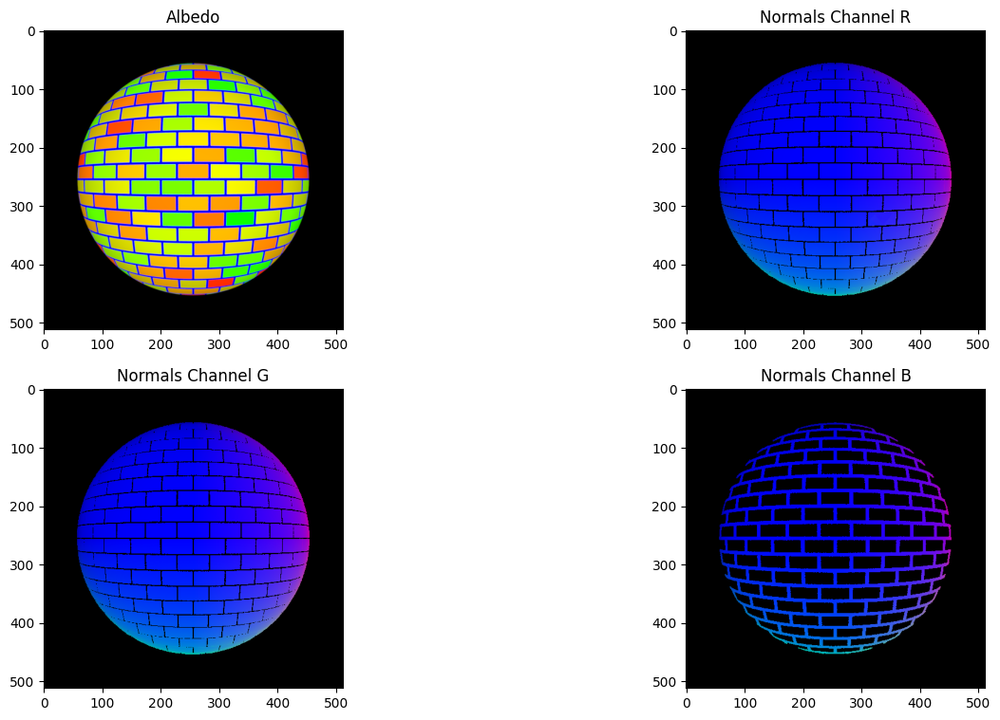

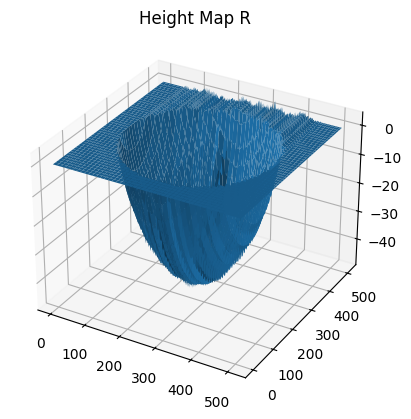

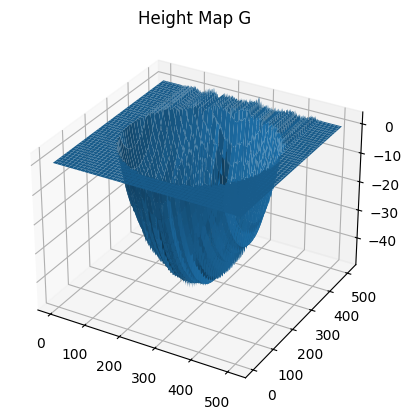

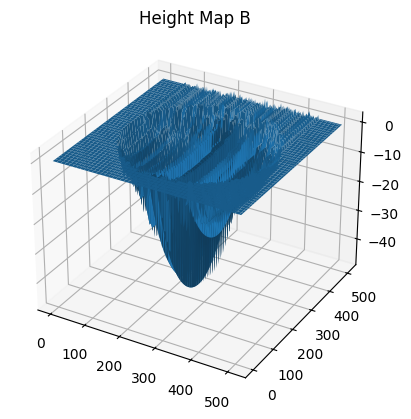

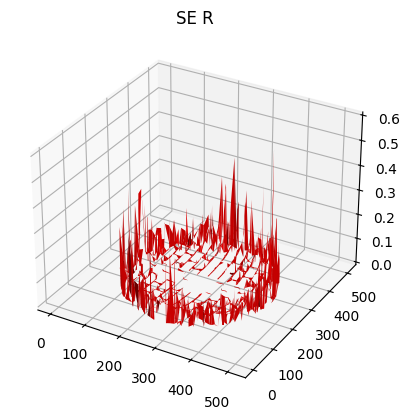

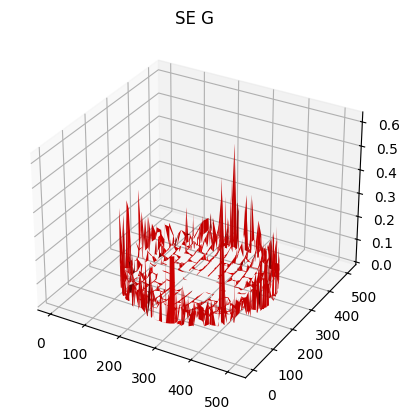

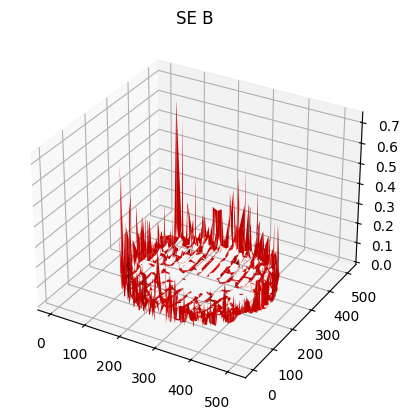

In [ ]:
photometric_stereo_rgb(image_dir='./photometrics_images/SphereColor')

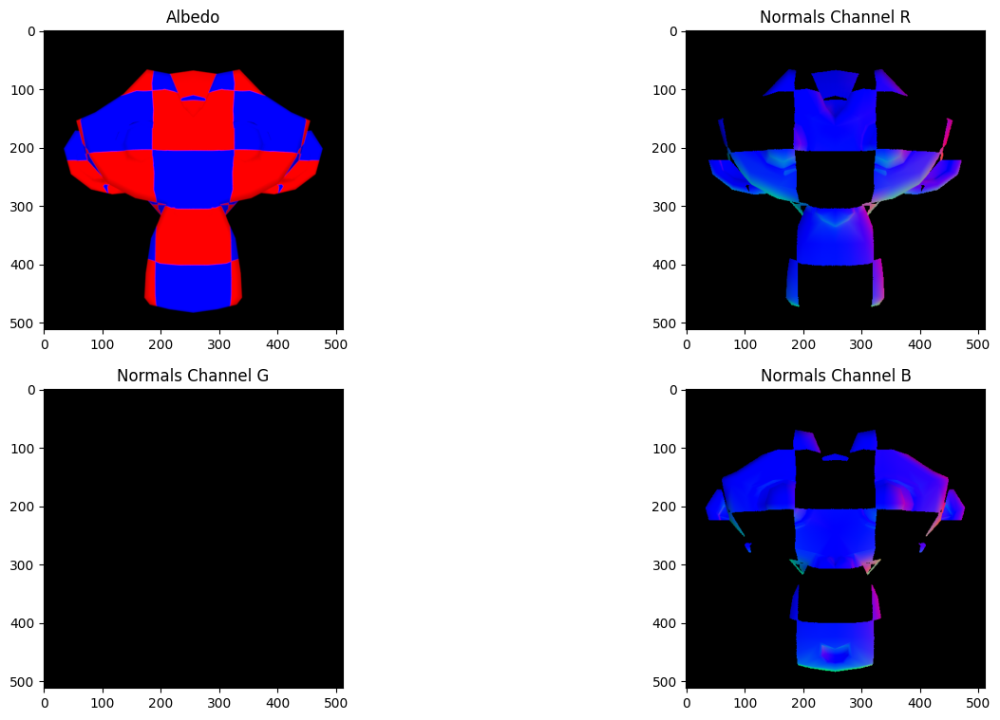

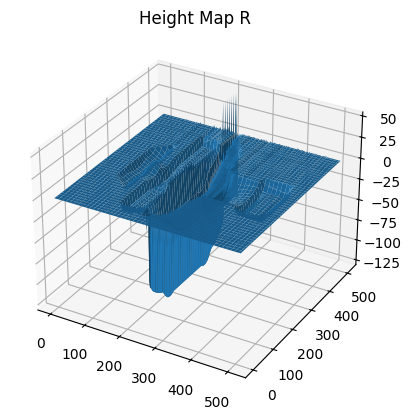

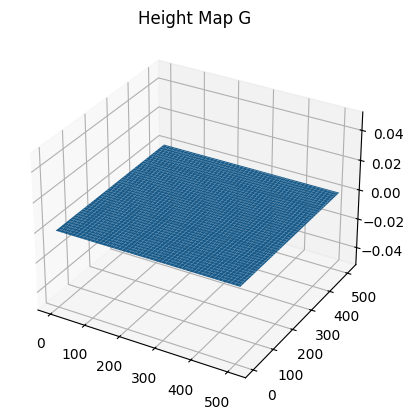

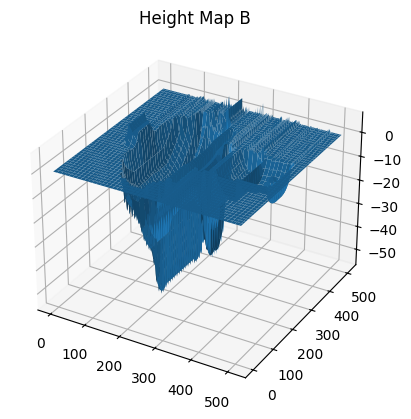

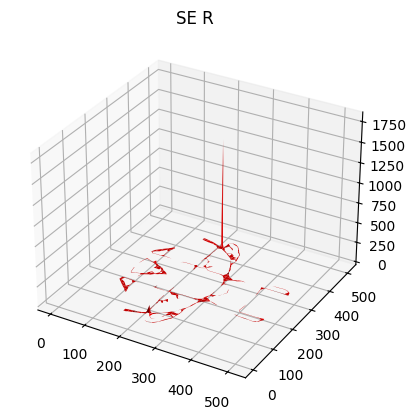

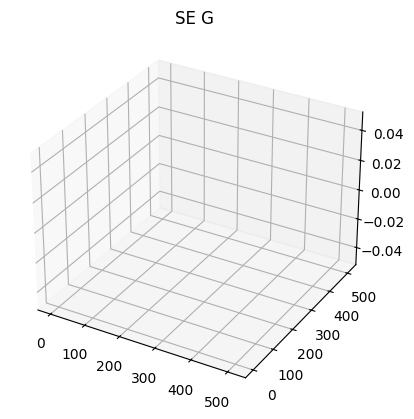

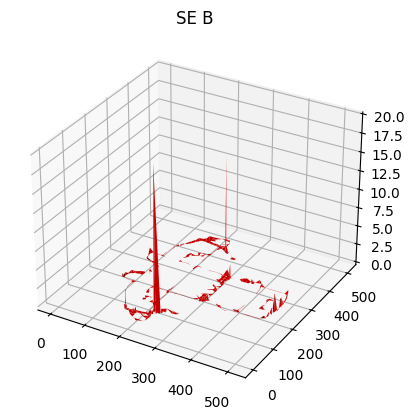

In [ ]:
photometric_stereo_rgb(image_dir='./photometrics_images/MonkeyColor')

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

>*Each of the R, G and B channels were treated as a separate channel with independent processing using the shadow trick. Finally the channels were combined by concatenation. On account of this change the albedo also has information about the colour of the light reflected. If we want to obtain the net intensity reflected this can be done by linearly combining the values of the three channels [(Scikit-learn)](https://scikit-image.org/docs/0.25.x/auto_examples/color_exposure/plot_rgb_to_gray.html)*

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

>*A zero pixel occurs when a pixel is black in every image. In calculating the surface normal, g / |g|, A stabilisation_constant (of 0.0001) is added, so the denominator never becomes zero. However, this still results in the albedo and normal being 0. The normals are used in surface reconstruction. The height map uses the gradients of those, and therefore would spread/propagate these errors. A solution might be to interpolate, using the (average of) neighboring pixels, for the zero pixels [Interpolation](https://www.cambridgeincolour.com/tutorials/image-interpolation.htm)*.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [ ]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [ ]:
def photometric_stereo_face_dataset(image_dir='./images/photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """
    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.001

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')
    h_avg = construct_surface(p, q, path_type=path_type)
    h_col = construct_surface(p, q, path_type="column")
    h_row = construct_surface(p, q, path_type="row")
    
    # show results
    print('Displaying results...\n')
    
    show_results(albedo, normals, h_avg, SE, height_label="Average Height Map")
    show_results(None, normals, h_col, None, normal_plot=False, height_label="Column Height Map")
    show_results(None, normals, h_row, None, normal_plot=False, height_label="Row Height Map")

    return None

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 9788

Computing surface height map...

Displaying results...



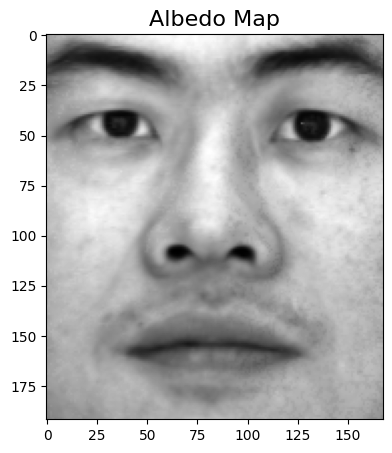

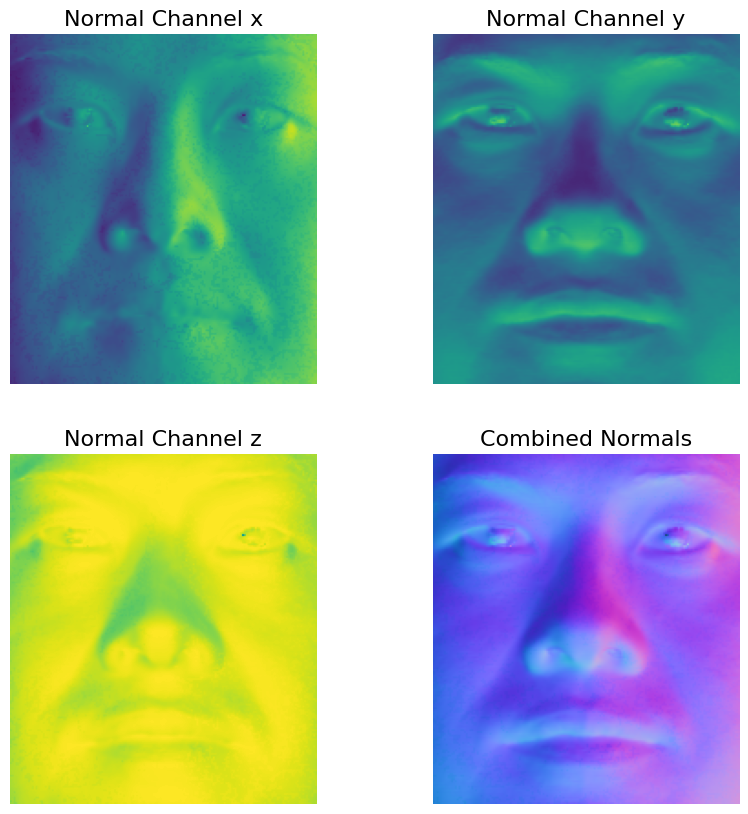

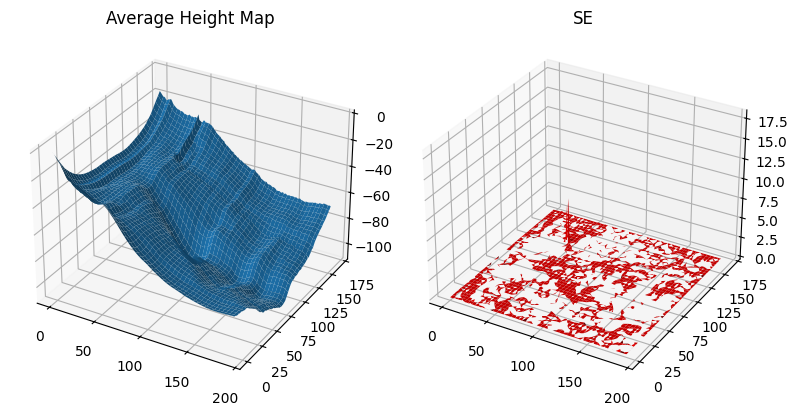

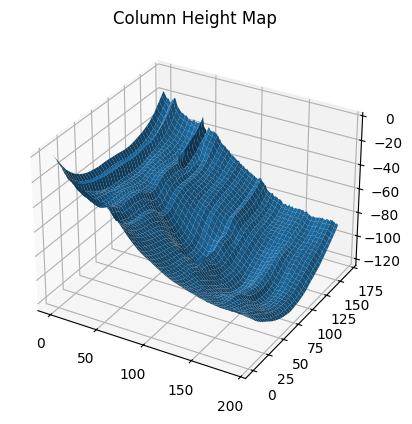

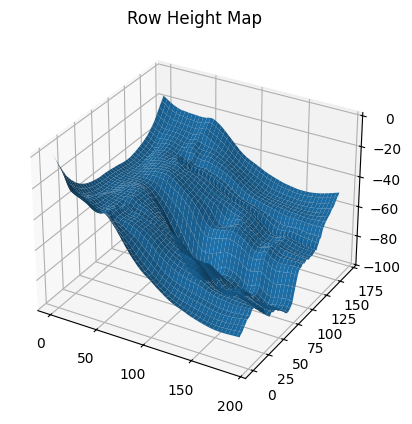

In [ ]:
photometric_stereo_face_dataset(image_dir="./photometrics_images/yaleB02/")

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

>*Similar to question 23 with the sphere, the column height map has horizontal height differences. However now, the row height map does not have these extreme differences vertically and is smoother in general. The nose (vertical feature) is well-preserved in the column height map, while the eyes (mostly row-feature) is better preserved in the row height map.  The average is a clear combination of these two.*


<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

>The three assumed assumptions: [(Source)](https://www.sciencedirect.com/science/article/pii/S1077314297905221)<br>
>**Lambertian Surface**<br>
This assumption assumes that light reflects/diffuses uniformly in all directions. This is not the cases with faces, because faces exist of different "surfaces" (eyes, eyebrows, lips) that also reflect differently. Therefore, it does not reflect uniformly in all directions.<br> 
>**Distant point light source**<br>
It assumes the light source is infinitely far away, and therefore assumes the light rays are parallel. We assume the light source is close to the face.<br>
>**Orthographic projection**<br>
Orthographic projection is a form of parallel projection, where all the projection lines are orthogonal to the projection plane [Wikipedia](https://en.wikipedia.org/wiki/Orthographic_projection). This is also not the case, as rays can come from different angles in an image, as faces have different angles of reflections at different locations. The light source is also coming from the right side in the image example below, they will not be reflected perpendicular to the plane.


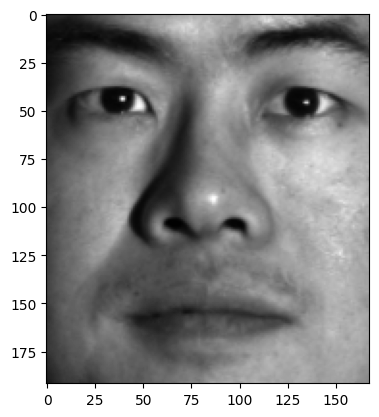

In [ ]:
filename = os.path.join("./photometrics_images/yaleB02/", 'yaleB02_P00A-025E+00.pgm')
ambient_image = cv2.imread(filename, -1)
plt.imshow(ambient_image, cmap='gray')

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [ ]:
bad_images = [
    "yaleB02_P00A+070E+00.pgm",
    "yaleB02_P00A+070E+45.pgm",
    "yaleB02_P00A+085E+20.pgm",
    "yaleB02_P00A+095E+00.pgm",
    "yaleB02_P00A+110E+15.pgm",
    "yaleB02_P00A+110E+40.pgm",
    "yaleB02_P00A+110E+65.pgm",
    "yaleB02_P00A+120E+00.pgm",
    "yaleB02_P00A+130E+20.pgm",
    "yaleB02_P00A-035E+65.pgm",
    "yaleB02_P00A+035E+65.pgm",
    "yaleB02_P00A-050E-40.pgm",
    "yaleB02_P00A+050E-40.pgm",
    "yaleB02_P00A-060E-20.pgm",
    "yaleB02_P00A-060E+20.pgm",
    "yaleB02_P00A+000E+90.pgm",
    "yaleB02_P00A+020E-10.pgm",
    "yaleB02_P00A-070E+00.pgm",
    "yaleB02_P00A-070E+45.pgm",
    "yaleB02_P00A-085E+20.pgm",
    "yaleB02_P00A-095E+00.pgm",
    "yaleB02_P00A-110E+15.pgm",
    "yaleB02_P00A-110E+40.pgm",
    "yaleB02_P00A-110E+65.pgm",
    "yaleB02_P00A-120E+00.pgm",
    "yaleB02_P00A-130E+20.pgm",
    "yaleB02_P00A-070E-35.pgm",
    "yaleB02_P00A+070E-35.pgm",
    "yaleB02_P00A-085E-20.pgm",
    "yaleB02_P00A+085E-20.pgm",
    "yaleB02_P00A+085E+20.pgm",  
    "yaleB02_P00A-110E-20.pgm",
    "yaleB02_P00A+110E-20.pgm",
]
bad_images = sorted(set(bad_images))

In [ ]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 64

    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)

    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))

    # Remove bad images
    bad_set = set(bad_images)
    d = [p for p in d if os.path.basename(p) not in bad_set]

    # randomly select a subset of images to match the num_images count
    import random
    if len(d) > num_images:
        d = random.sample(d, num_images)
    else:
        # keep all remaining if fewer than requested
        num_images = len(d)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = np.array([-1,-1,1]) * np.array([y,z,x]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [ ]:
def photometric_stereo_face_filtered(bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images=bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    #shadow trick = default is false
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.001

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')
    h_avg = construct_surface(p, q, path_type=path_type)
    h_col = construct_surface(p, q, path_type="column")
    h_row = construct_surface(p, q, path_type="row")
    
    # show results
    print('Displaying results...\n')
    
    show_results(albedo, normals, h_avg, SE, "Average Height Map (filtered)")
    show_results(None, normals, h_col, None, normal_plot=False, height_label="Column Height Map (filtered)")
    show_results(None, normals, h_row, None, normal_plot=False, height_label="Row Height Map (filtered)")

    return None

Loading images...

Finish loading 32 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 6363

Computing surface height map...

Displaying results...



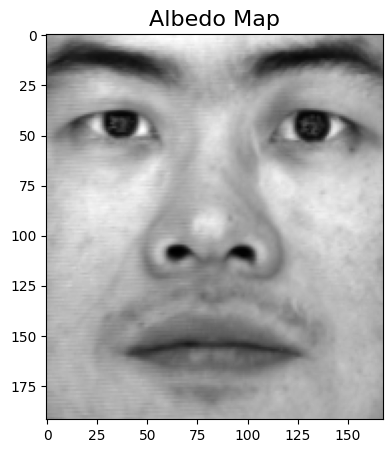

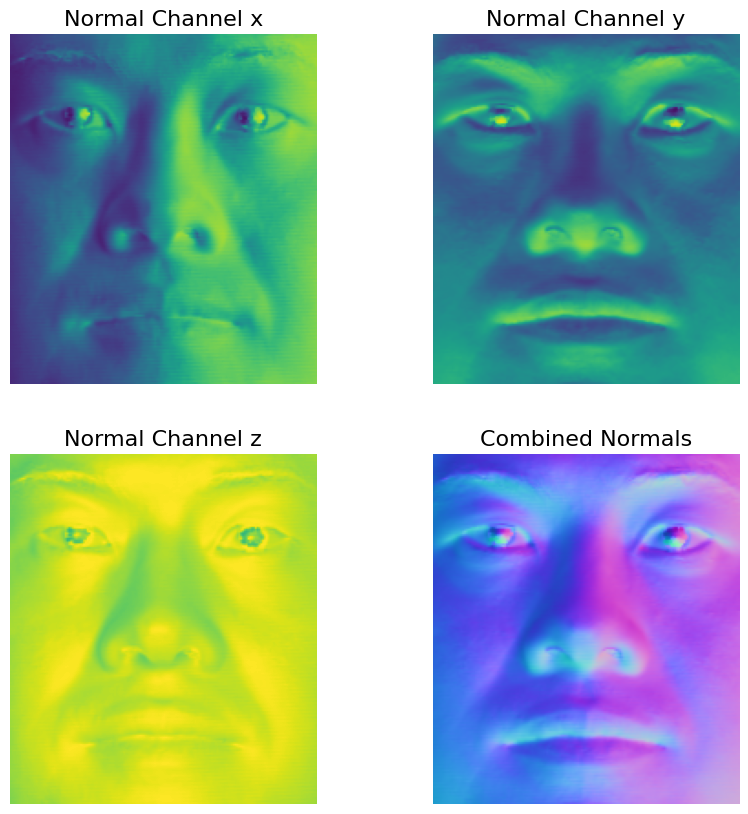

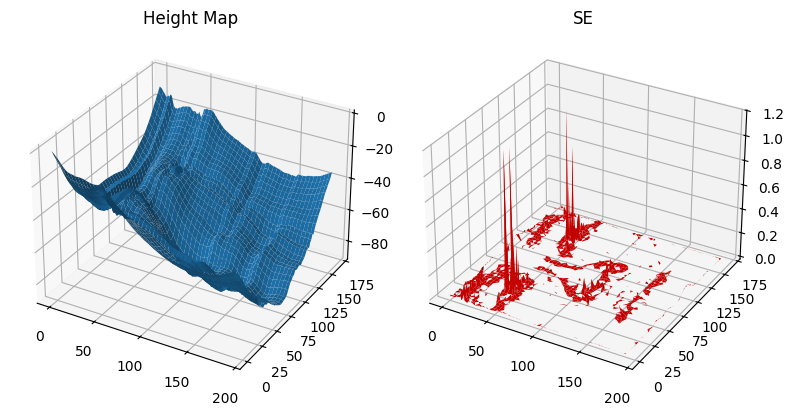

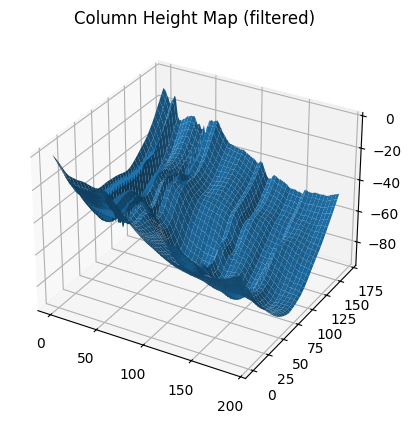

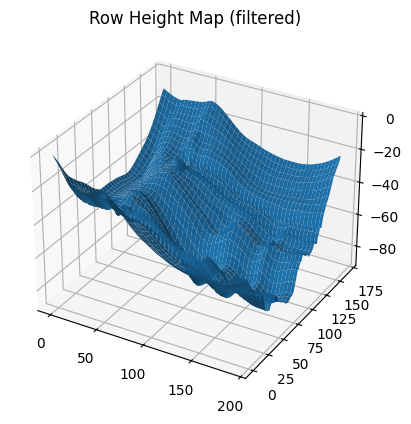

In [ ]:
photometric_stereo_face_filtered(bad_images=bad_images, image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average')

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

>*The contours of the face have improved definition with better normals. The Overall Squared Error has reduced but SE of features with complex composition like lips, eyeballs and eyebrows are still relatively high compared to other regions.*

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [ ]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [ ]:
def photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """
    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.001 

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')
    
    height_map = construct_surface(p, q, path_type)
    
    # show results
    print('Displaying results...\n')
    
    show_results(albedo, normals, height_map, SE, height_label=f"{path_type} Height Map", 
                 SE_label=f"{path_type} SE")
   
    return None

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 243273

Computing surface height map...

Displaying results...



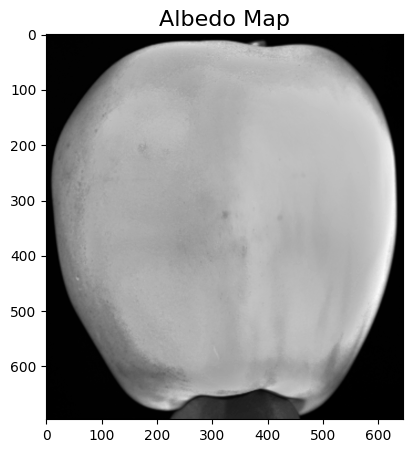

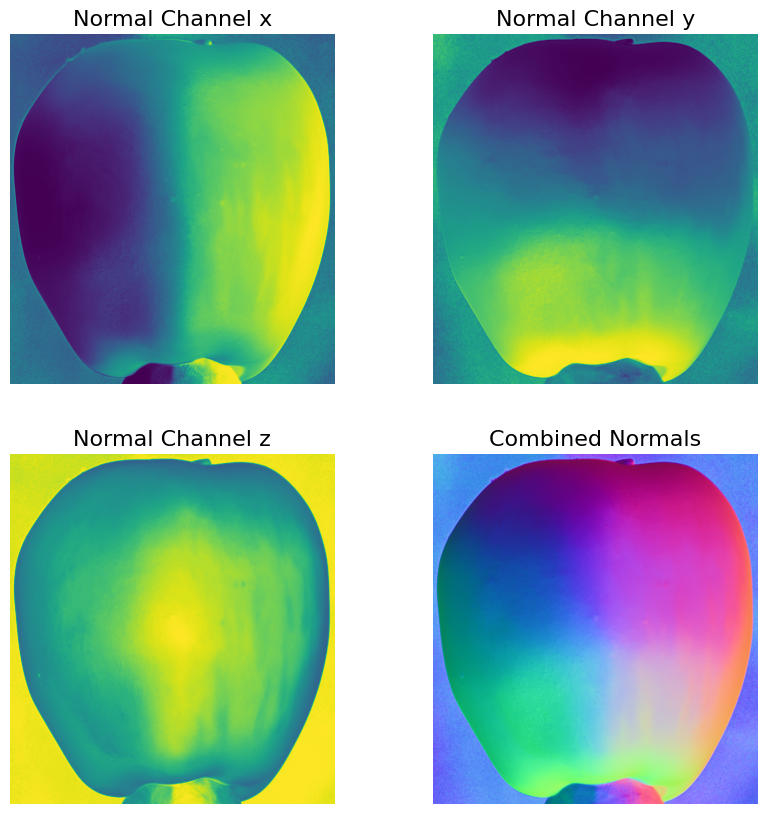

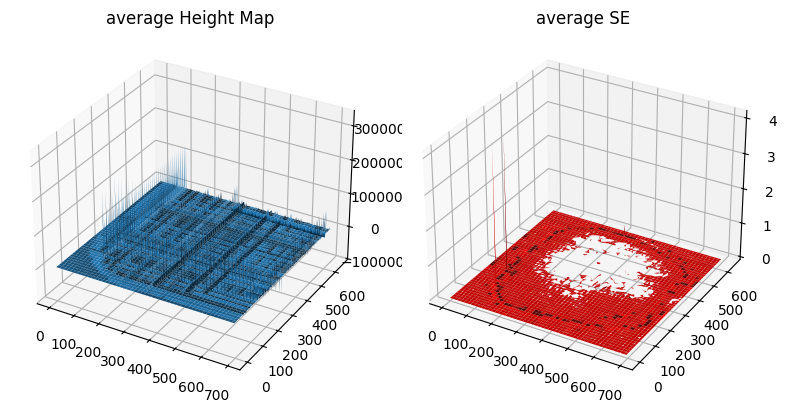

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 243273

Computing surface height map...

Displaying results...



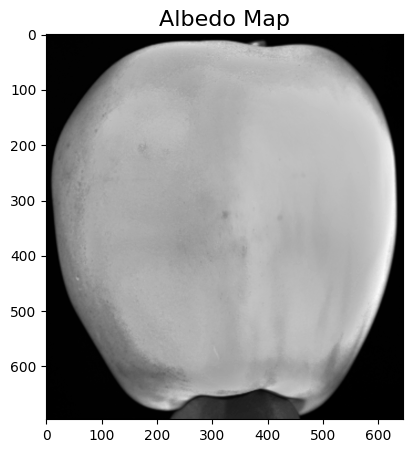

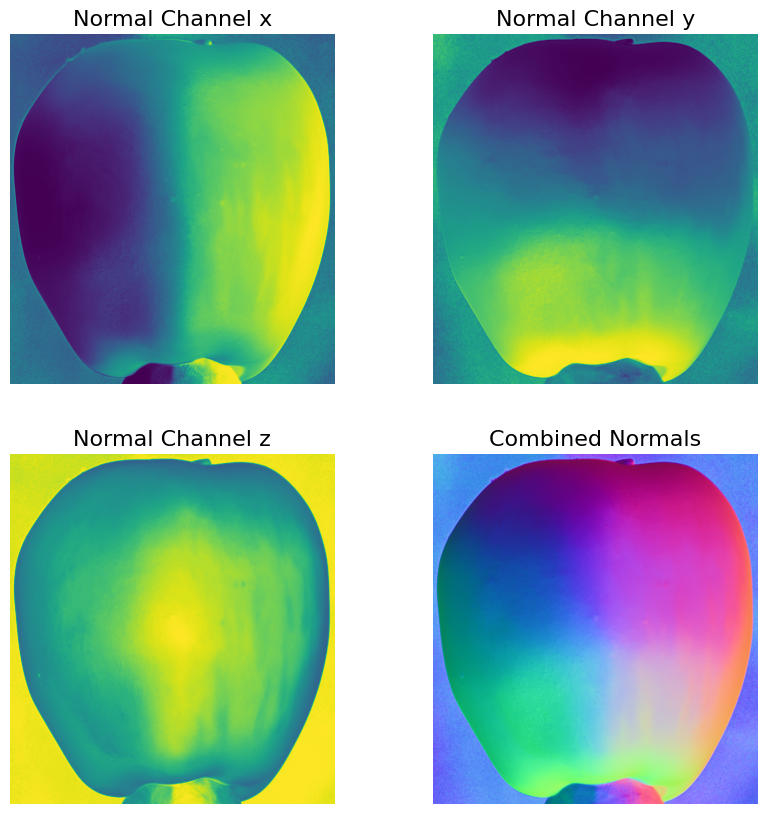

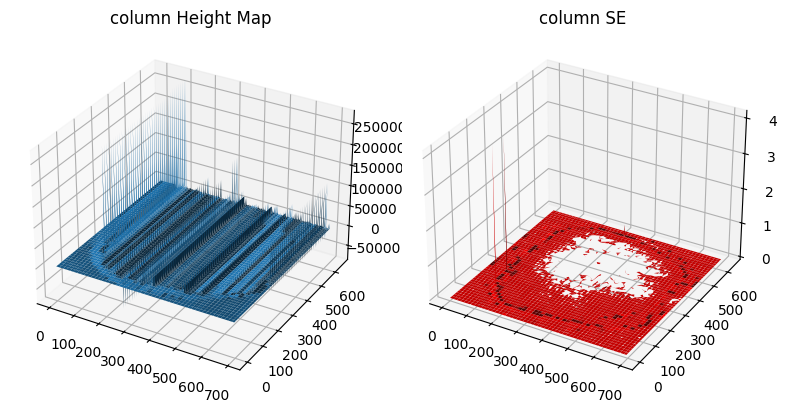

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 243273

Computing surface height map...

Displaying results...



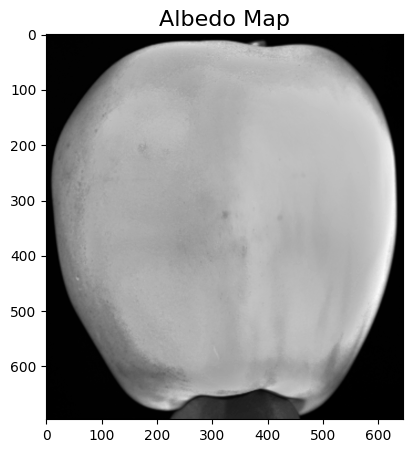

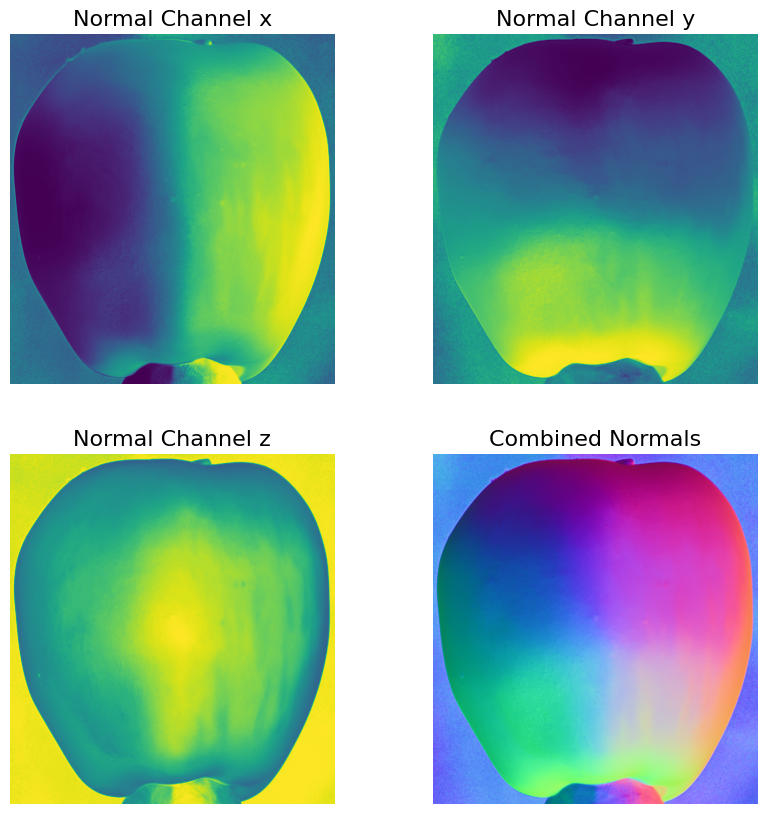

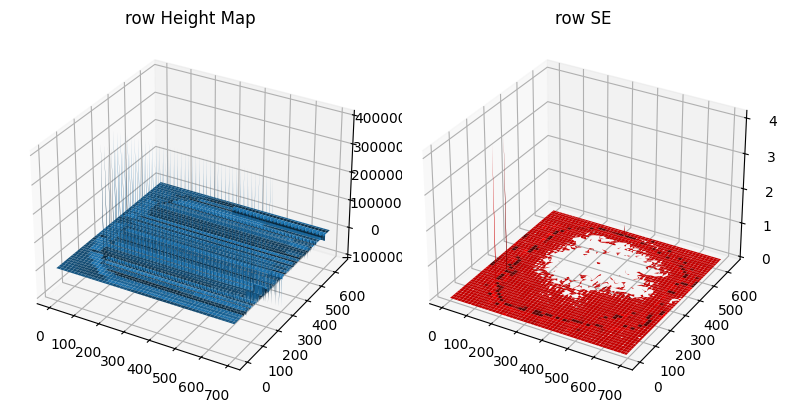

In [ ]:
# YOUR CODE HERE
avg = photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average')
col = photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='column')
row = photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='row')

<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

>*For the albedo image and separately plotted normals, we cannot really distinguish (visually) between the different paths. However, the height maps show the differences. The height map shows the path taken when getting the integrals. The column path takes first the integral vertically. Afterwards, they go over them horizontally. If there is noise or slightly off estimation in the vertical integral, this spreads horizontally creating these horizontal lines in the height-map. And vice-versa for the row-path. In this comparison, the column height map has more variation in height than the row map. The average path takes the average of the computed heigh via column and row, creating a cross pattern. However, because the average is being taken, the errors will be balanced between the two paths.*

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Rakesh Raj Madavan  | 33.3 % | 33.3 % | 33.3 % |
| Kim Verkuijl | 33.3 % | 33.3 % | 33.3 % |
| Mattia Sferazza | 33.3 % | 33.3 % | 33.3 % |

### - End of Notebook -